# Generating Buy and Sell Signals

### Overview
- There are two strategies developed for labelling the data as buy and sell.
- Those strategies are built on training data and tested on validation and test data.
- After verifying if the strategies are working fine, two classification methods are tried on these.
- The strategy is based on logreturns but considering the literature available online, indicators which are prominently used for technical analysis are used.
- The ML methods don't perform very well.
- The strategies seem very good and can work out well if the return is forecasted well in the decided horizon.
- A few indicators are developed based on the lagged returns and logreturns.
- This is to check if it gives different resutls than technical analysis indicators.
- Finally it's concluded that if the forecasted return is correctly predicted (possibly an ARCH or GARCH model) the strategy can work well with some intelligence on the size of the bet and availability of the fund.

In [1]:
# !pip3 install pandas
# !pip3 install time
# !pip3 install numpy
# !pip3 install sklearn
# !pip3 install requests
# !pip3 install ta
# !pip3 install matplotlib
# !pip3 install seaborn
# !pip3 install imblearn
# !pip3 install statsmodels

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import time
import requests
import matplotlib.pyplot as plt
import ta
from imblearn.over_sampling import SMOTE 
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
import warnings
warnings.filterwarnings("ignore")

In [3]:
Results={}

### About the data
- The data is BTCUSDT taken at the interval of 1min for 1000 times.
- Such eight repititions are done.
- It turns out that this is the data from 2021-05-08 04:50:00 to 2021-05-13 18:09:00.
- This is without any loss of generality. Since the assignment was taken at that point of time and we could take the data from the past. This is used.
- Then the data is divided into train, validation and test. Approximately 8:5:6 randomly.

### About the strat
- The forecast horizon for the return is 1 min.
- We would be considering what is happening in the next minute and the taking our decision

In [4]:
EndTime=1620929340000
StartTime =1620869340000
dtemp=[]
train_size = 4800
val_size = 1500
test_size = 8000 - train_size-val_size
for i in range(8):
    url="https://public.coindcx.com/market_data/candles?pair=B-BTC_USDT&interval=1m&limit=1000&endTime="+str(EndTime)+"&startTime="+str(StartTime)
    response = requests.get(url)
    data_collected = response.json()
    data_temp = pd.DataFrame(data_collected,columns=['time','open','high','low','close','volume'])
    data_temp['time'] =  pd.to_datetime([time.strftime("%Y-%m-%d %H:%M:%S", time.gmtime(i//1000)) for i in data_temp['time']])
    data_temp.set_index(['time'],inplace=True)
    EndTime = EndTime - 60*1000*1000
    StartTime = StartTime - 60*1000*1000
    dtemp.append(data_temp)
data_full=pd.concat(dtemp)
data_full=data_full.iloc[::-1]

In [5]:
index = data_full.index
is_duplicate = index.duplicated(keep="first")
not_duplicate = ~is_duplicate
data_full = data_full[not_duplicate]
data_train = data_full.iloc[0:train_size]
data_val = data_full.iloc[train_size:train_size+val_size]
data_test = data_full.iloc[train_size+val_size:train_size+val_size+test_size]

In [6]:
data_train['returns']=data_train['close'].pct_change()
data_train['logreturns']=np.log(data_train['returns']+1)

data_val['returns']=data_val['close'].pct_change()
data_val['logreturns']=np.log(data_val['returns']+1)

data_test['returns']=data_test['close'].pct_change()
data_test['logreturns']=np.log(data_test['returns']+1)

(-0.02, 0.02)

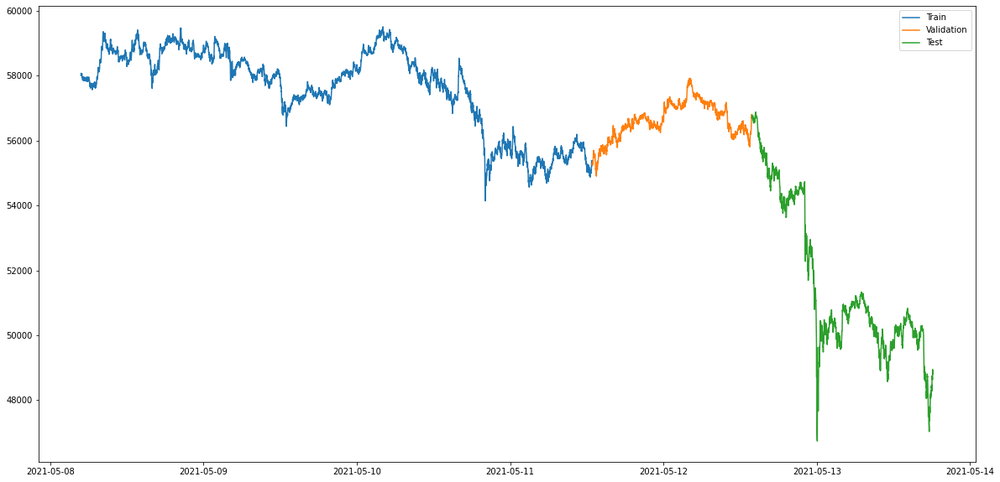

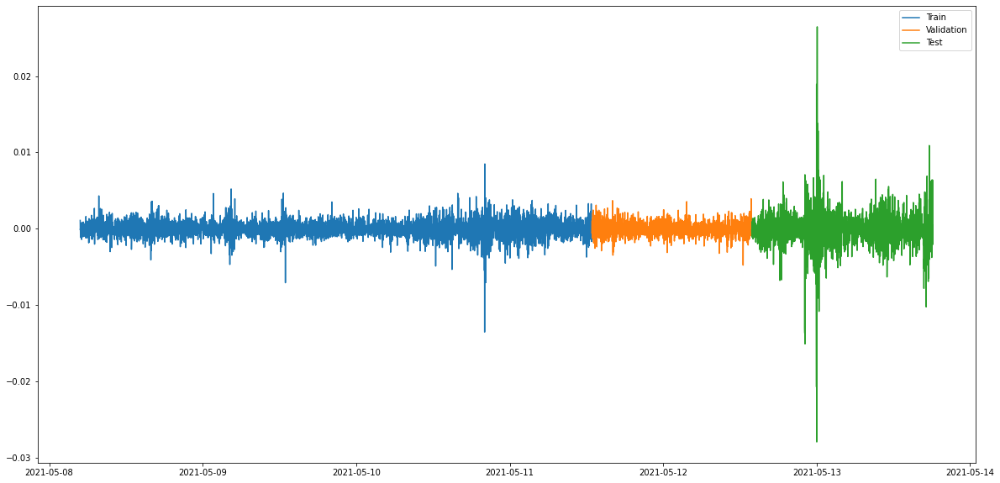

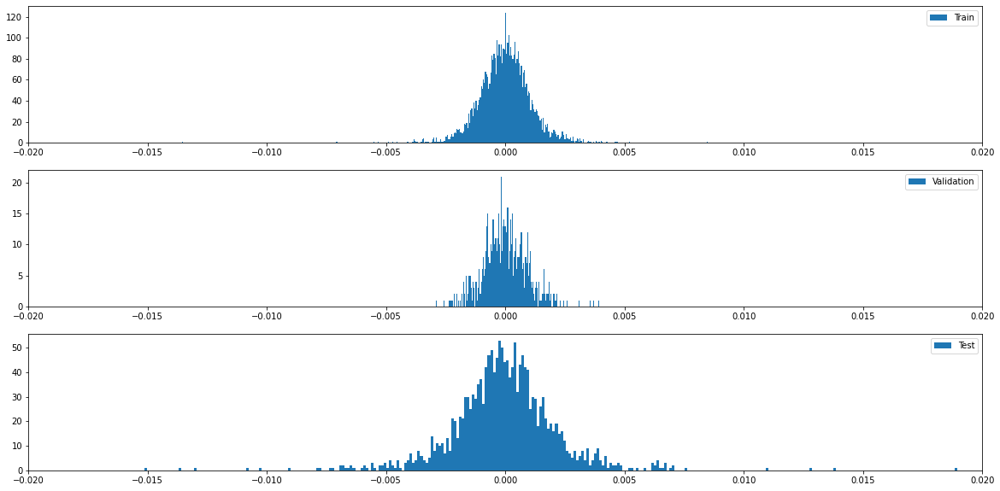

In [7]:
plt.figure(figsize=(20, 10))
plt.plot(data_train.close)
plt.plot(data_val.close)
plt.plot(data_test.close)
plt.legend(['Train','Validation','Test'])

plt.figure(figsize=(20, 10))
plt.plot(data_train.logreturns)
plt.plot(data_val.logreturns)
plt.plot(data_test.logreturns)
plt.legend(['Train','Validation','Test'])

plt.figure(figsize=(20, 10))
plt.subplot(311)
plt.hist(data_train.logreturns,bins=500)
plt.legend(['Train'])
plt.xlim([-0.02,0.02])
plt.subplot(312)
plt.hist(data_val.logreturns,bins=500)
plt.legend(['Validation'])
plt.xlim([-0.02,0.02])
plt.subplot(313)
plt.hist(data_test.logreturns,bins=500)
plt.legend(['Test'])
plt.xlim([-0.02,0.02])

Making the MACD, Bollinger Bands, RSI and stuff. This was just to play around a bit. But was not used.

In [8]:
signals = pd.DataFrame(index=data_train.index)
signals['signal'] = 0.0
shortterm=8
longterm=40
midterm=15
signals['short_mavg'] = data_train['close'].rolling(window=shortterm, min_periods=1, center=False).mean()
signals['long_mavg'] = data_train['close'].rolling(window=longterm, min_periods=1, center=False).mean()
signals['emsa']=data_train['close'].ewm(span=12,adjust=False).mean()
signals['emwa']=data_train['close'].ewm(span=30,adjust=False).mean()
signals['MACD'] = signals['emsa']-signals['emwa']
signals['MACD_SIG'] = signals['MACD'].ewm(span=9,adjust=False).mean()
signals['Bol_m']= data_train.close.rolling(window=15,center=False,min_periods=1).mean()
signals['Bol_s']= data_train.close.rolling(window=15,center=False,min_periods=1).std()
signals['Bol_u']=signals['Bol_m']+2*signals['Bol_s']
signals['Bol_d']=signals['Bol_m']-2*signals['Bol_s']
del signals['Bol_m']
del signals['Bol_s']
delta1 = data_train.close.diff()
dup,ddown = delta1.copy(),delta1.copy()
dup[0>dup]=0
ddown[delta1>0]=0
signals['RSI']=dup.rolling(window=14,min_periods=1,center=False).mean()/ddown.rolling(window=14,min_periods=1,center=False).mean()
signals['RSI']=100 - 100/(1-signals['RSI'])
del dup
del ddown

So the signals is our set of indicators. We will get our base strategy working and on then see if it is working well on train, val and split data. Post that we will try the ML approach with these indicators. 

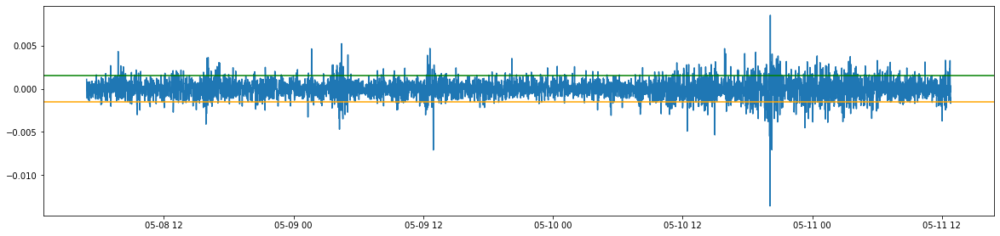

In [9]:
plt.figure(figsize=(20, 10))
plt.subplot(211)
plt.plot(data_train['logreturns'])
plt.axhline(0.001*1.5,color='green')
plt.axhline(-0.001*1.5,color='orange')

###  Trading strategy

- if the next minute return is positive and greater than 1.5sd of the returns 
    - send a buy signal.
- if the next minute return is negative and lesser than 1.5 sd of the returns  
    - send a sell signal.

Here the basic idea is:
\begin{equation}
  y_{n} =
    \begin{cases}
      1 & \text p_{n+1} > p_{n}\\
      0 & \text p_{n+1} = p_{n}\\
      -1 & \text p_{n+1} < p_{n}
    \end{cases}       
\end{equation}
where $${Buy:1, Sell:-1, Hold:0}$$
$$ p_n \text { is the price at } n $$
$$ y_n \text { is the signal at } n $$


In [10]:
def create_labels_simple(df,thold,maxposition=0):
    total_rows = len(df)
    labels = np.zeros(total_rows)
    returns = df['logreturns']   
    for i in range(1,len(labels)):
        if returns[i]>thold:
            labels[i-1]=1
        elif returns[i]<-1*thold:
            labels[i-1]=-1
        else:
            labels[i-1]=0
    return labels

This value is determined by looking at the 1.5 times the sd of the logreturns in the train data. It's a heuristic

In [11]:
sig_thold=0.001*1.5

### A few caveats
- In all the strategies there's a naive assumption that the number of bitcoins that will be bought in fix amounts. An important aspect of any trading strategy would be to decide the number of bitcoins to be bought in the portfolio or to be sold from the portfolio in addition to the buy and sell signals.
- The person can buy or sell securities without promising the delivery of the shares.
- This sort of becomes a subjective problem as to how much one is ready to invest, ready to take the risk, and a few other factors.
- That particular aspect is not included here explicitly but an attempt is made w.r.t. to the maximum position one can hold.
- Evaluation is done by considering a 100000 USDT. And everytime the bitcoin is bought or sold in 0.05 BTC. 
- We are not restricting the number of quantities which would be bought or sold here. So this is a pretty risky strategy.

In [12]:
def evaluate_strategy(labels,close,label):
    initial_capital= float(100000.0)
    number_of_btc=0.05
    portfolio = pd.DataFrame()
    portfolio.cash = initial_capital+(labels * close*-1*number_of_btc).cumsum()
    portfolio.holding_shares = labels.cumsum()
    portfolio.value_holding = portfolio.holding_shares*close*number_of_btc
    portfolio.value=portfolio.value_holding+portfolio.cash
    portfolio.returns = portfolio.value.pct_change()
    plt.figure(figsize=(20, 20))
    plt.title(label)
    plt.plot(portfolio.value)
    plt.plot(portfolio.cash)
    plt.plot(portfolio.value_holding)
    plt.legend(['Portfolio Value','Portfolio Cash','Portfolio Holding'])
    plt.figure(figsize=(20, 10))
    plt.plot(portfolio.value)
    plt.title('Portfolio Value')
    print(f'Return is {(portfolio.value.values[-1]-initial_capital)/initial_capital*100} % and final holding is {portfolio.holding_shares.values[-1]}*0.05 BTC')
    return portfolio

def calculate_sharpe(returns):
    mean = returns.mean()
    std = returns.std()
    return mean/std*np.sqrt(len(returns))

def portfolio_evaluation(data,func,sig_thold,text,maxposition):
    
    if func!=0:    
        data['labels']=func(data,sig_thold,maxposition)
    portfolio=pd.DataFrame()
    portfolio = evaluate_strategy(data['labels'],data['close'],text)
    sharpe=calculate_sharpe(portfolio.returns)
    buy = data['labels'][data.labels==1]
    sell= data['labels'][data.labels==-1]
    hold= data['labels'][data.labels==0]
    print(f'Buys:{len(buy)}, Sells:{len(sell)}, Holds:{len(hold)}')
    print(f'Sharpe Ratio is {sharpe}')
    print(f'Maximum quantities accumulated {max(abs(data.labels.cumsum()))}')
    D={}
    D['maxqty']=max(abs(data.labels.cumsum()))
    D['sharpe']=sharpe
    D['Finalreturn'] = (portfolio.value.values[-1]-100000)/100000*100
    return D

def make_data(df,to_drop):
    y = df['labels'].values
    df.drop('labels',axis=1,inplace=True)
    t=df.logreturns.shift(1)
    t1 = df.returns.shift(1)
    df['logreturns']=t.fillna(0)
    df['returns']=t1.fillna(0)
    if 'rolling_logreturns' in df.columns:
        m=df.rolling_logreturns.shift(1)
        df['rolling_logreturns']=m.fillna(0)
    df.reset_index(drop=False, inplace=True)
    df_train = df.loc[:, df.columns != 'time']
    Xtrain = df_train.drop(columns=to_drop).values
    return Xtrain,y

def evaluate_classification(ytrue,ypred):
    return metrics.classification_report(ytrue,ypred)

Return is 2.3193204999999724 % and final holding is -6.0*0.05 BTC
Buys:304, Sells:310, Holds:4186
Sharpe Ratio is 2.047198907538879
Maximum quantities accumulated 13.0


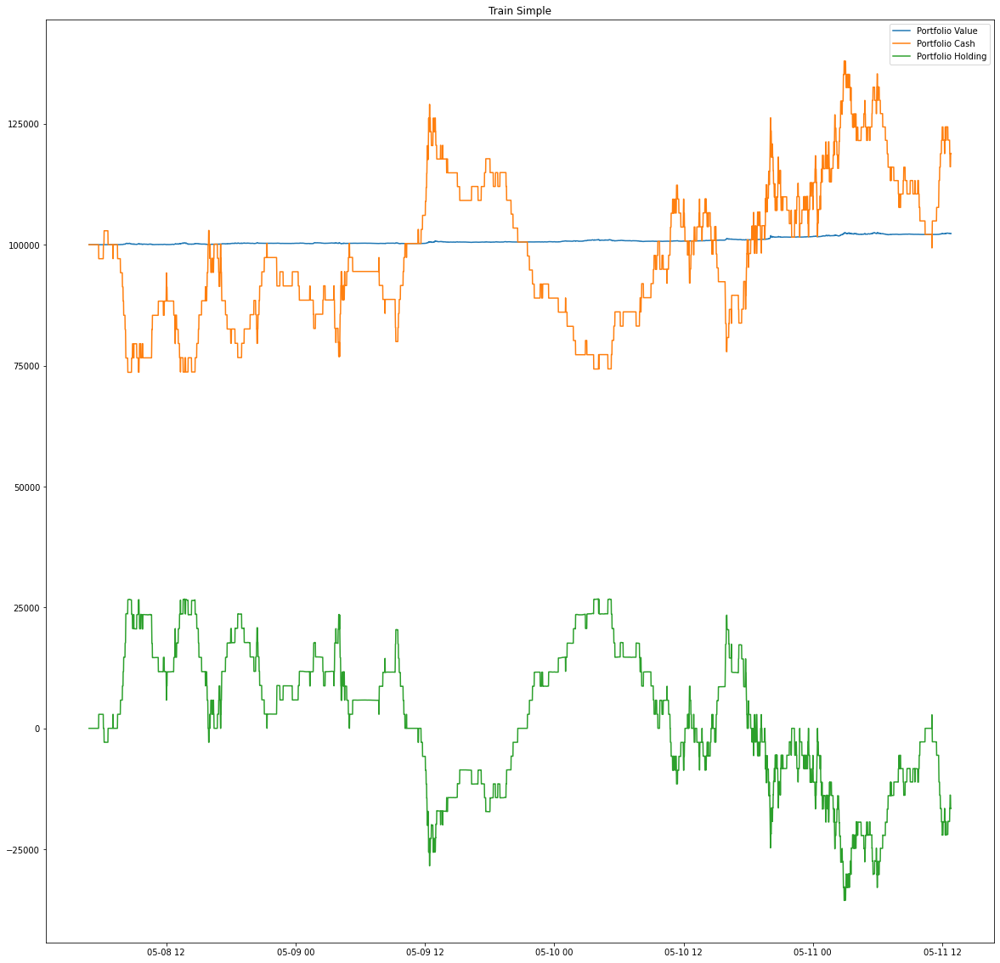

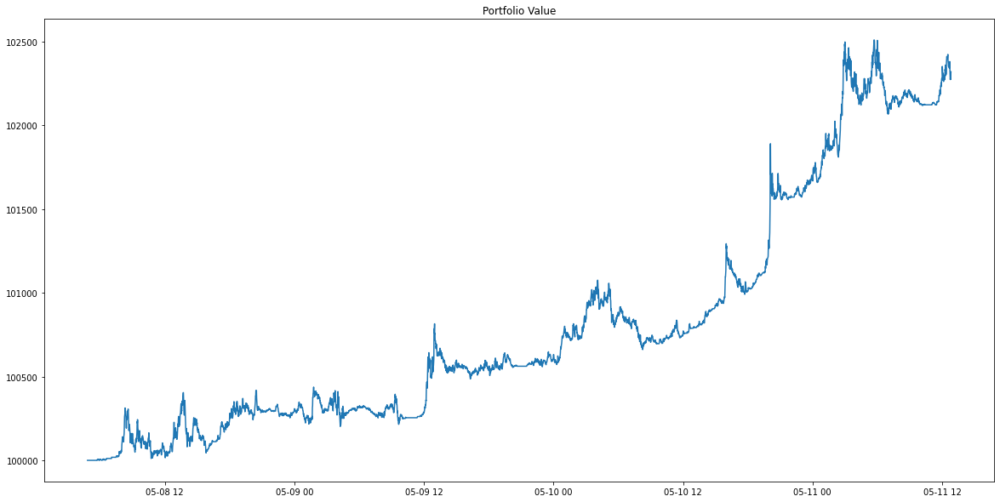

In [13]:
Results['Train_Simple']=portfolio_evaluation(data_train,create_labels_simple,sig_thold,'Train Simple',0)

Return is 0.43619800000000397 % and final holding is 15.0*0.05 BTC
Buys:83, Sells:68, Holds:1349
Sharpe Ratio is 0.5959486097585002
Maximum quantities accumulated 15.0


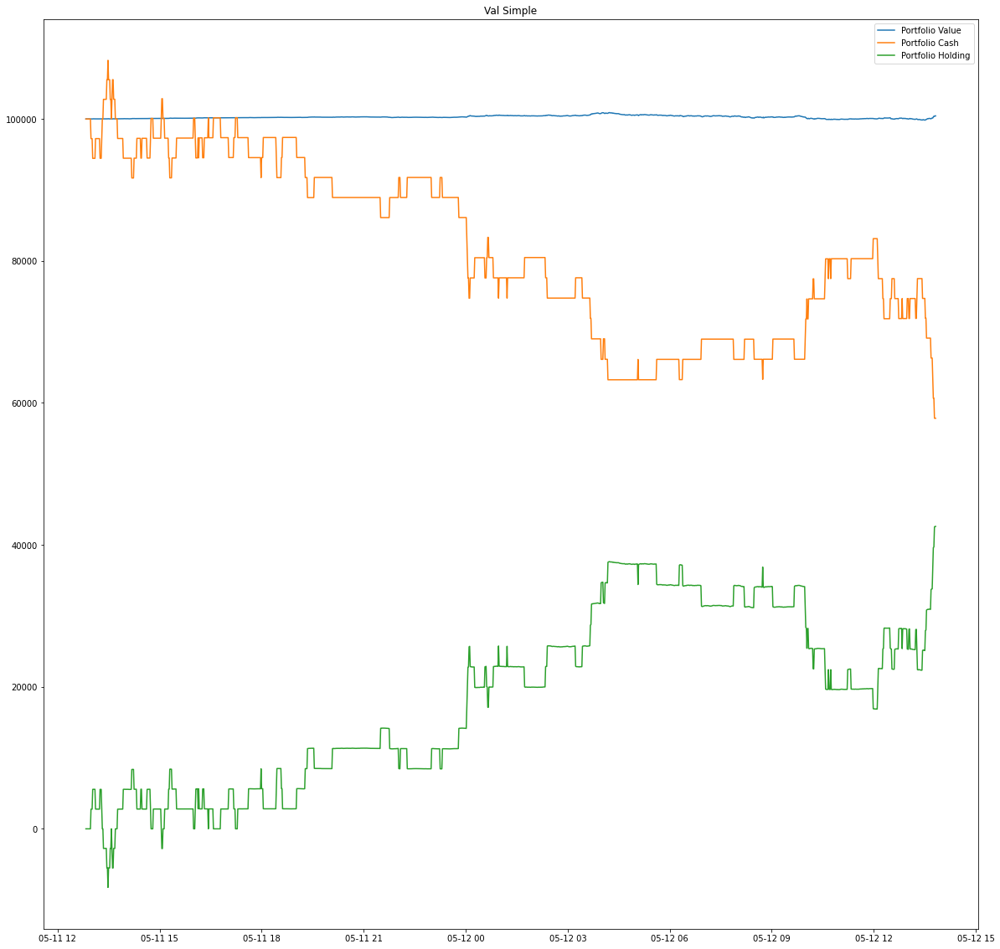

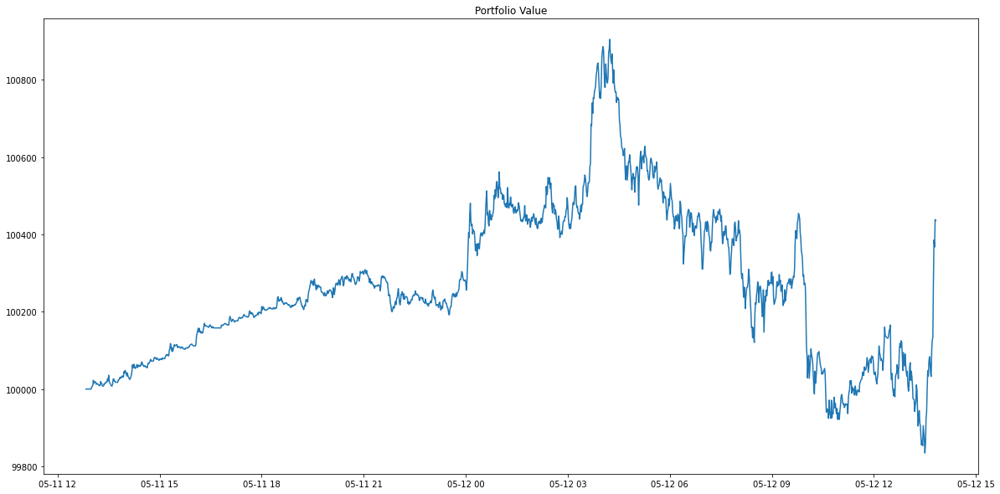

In [14]:
Results['Val_Simple']=portfolio_evaluation(data_val,create_labels_simple,sig_thold,'Val Simple',0)

Return is 10.241023500000113 % and final holding is -32.0*0.05 BTC
Buys:305, Sells:337, Holds:1058
Sharpe Ratio is 1.566389939277755
Maximum quantities accumulated 39.0


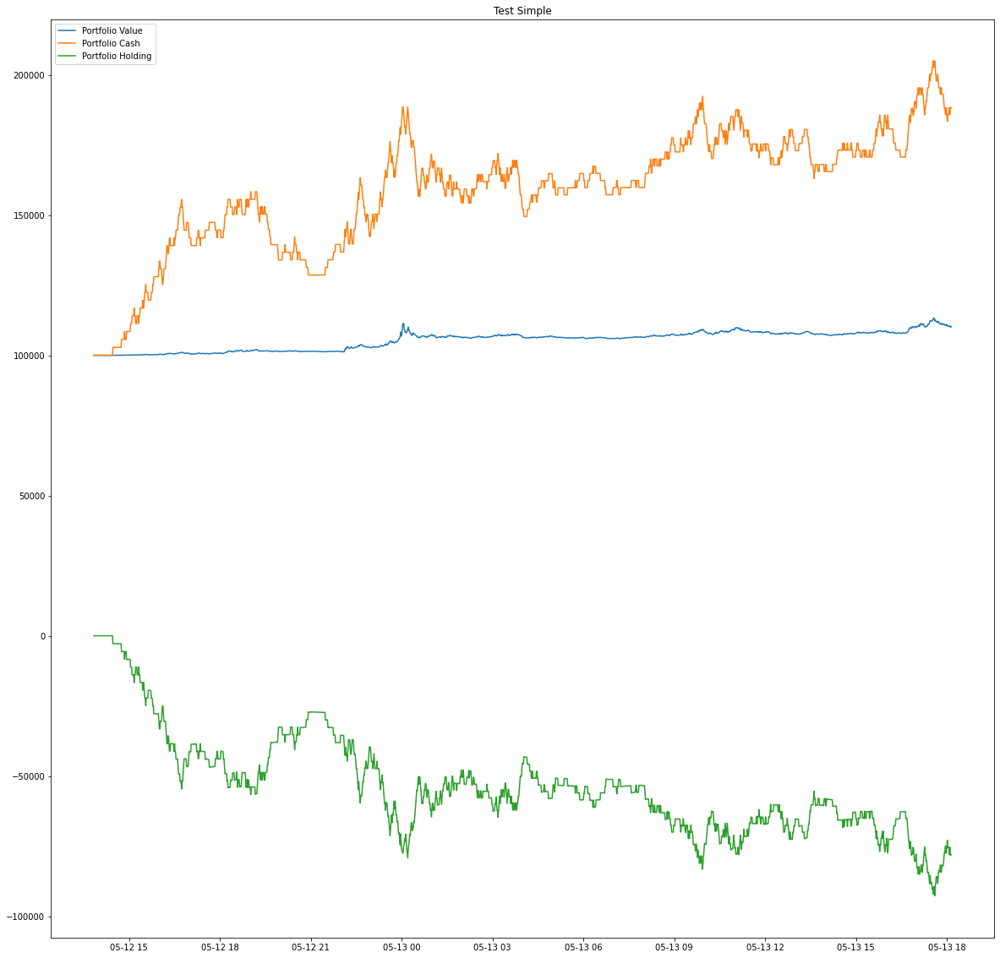

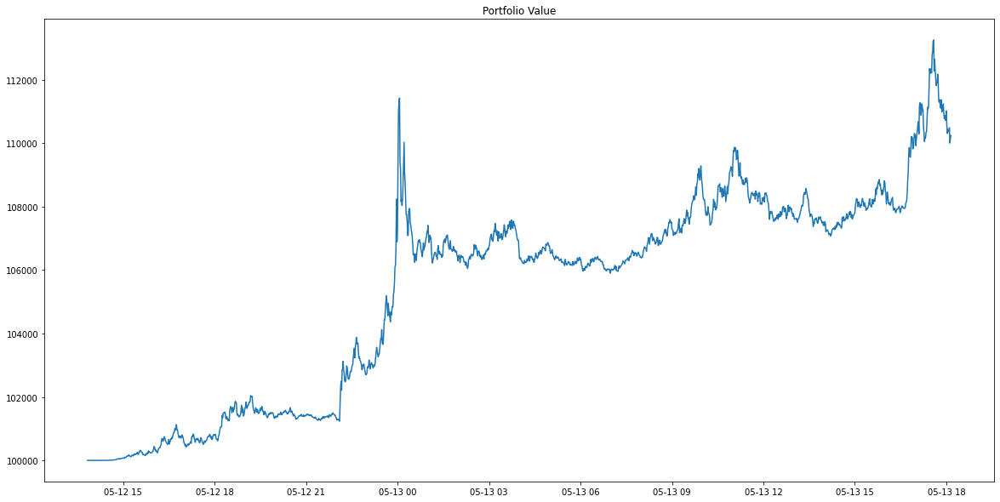

In [15]:
Results['Test_simple']=portfolio_evaluation(data_test,create_labels_simple,sig_thold,'Test Simple',0)

### Using ML and a few comments on the strat
- The strat is working very well on the data and giving good returns on train, validation, and test data.
- However there are a few concerns. These are as follows:
    - The number of quantities that are being accumulated. This implies at a particular instance we are holding a lot of risk which might not always be good. 
    - Now this can be solved by having the initial capital very large. 
    - So despite the strat being good, it should be limited with the number of quantities that can be bought or sold, or limit if the capital goes to zero.
    - Profit booking or tsl: Now there seem to be a few cases where we need to consider the profit booking and stopping our losses.
    - About using the machine learning: Now we are classifying the above strategy in buy sell or hold. Now if the number of buys and sells are checked w.r.t holds(for the train data) it is approximatedly 1:1:14. So for the classification algo to work, we must do a rebalancing of the classes. We can oversample with SMOTE in python.
    - So to solve the strategy related problems for labelling following are few suggestions:
        - Limit the quantities that you can accumulate. 
        - Use TSL/PB for making more profit.

In [16]:
df_train = ta.add_all_ta_features(data_train, "open", "high", "low", "close", "volume", fillna=True)
df_val = ta.add_all_ta_features(data_val, "open", "high", "low", "close", "volume", fillna=True)
df_test = ta.add_all_ta_features(data_test, "open", "high", "low", "close", "volume", fillna=True)

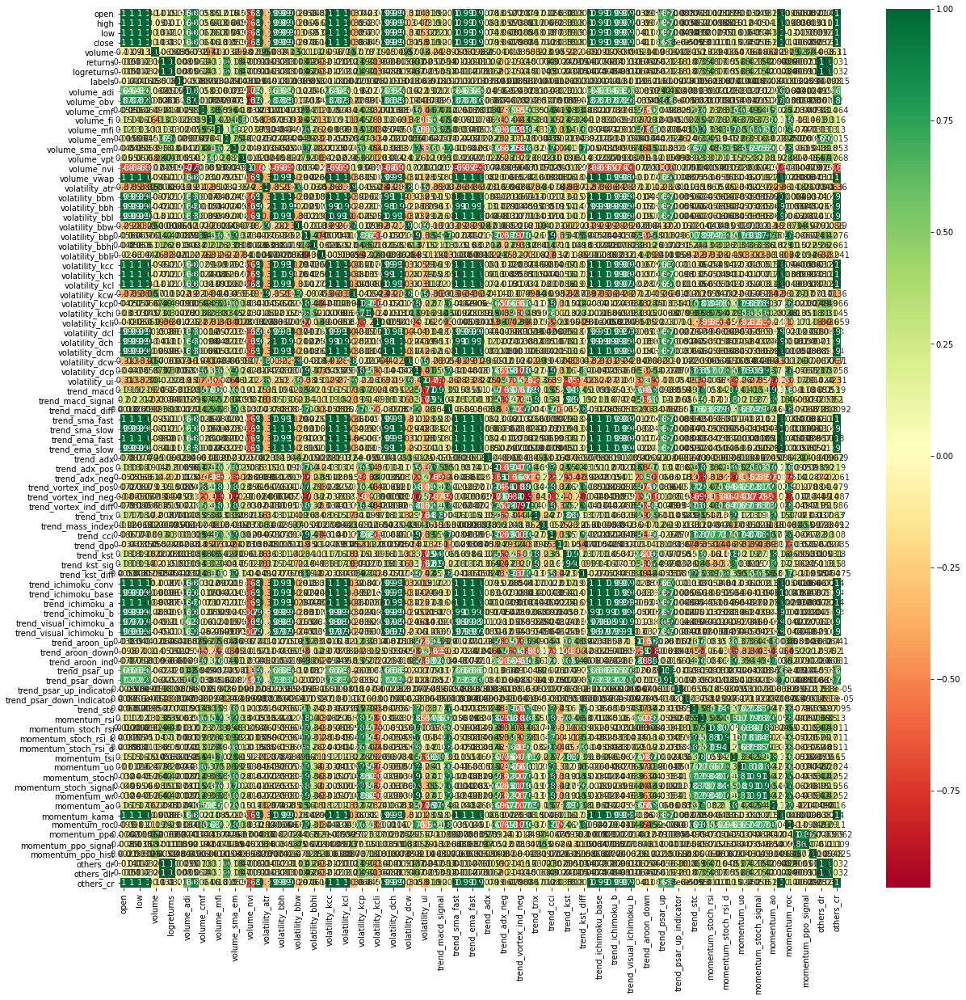

<Figure size 1080x504 with 0 Axes>

In [17]:
# This is where I got the top_corr list. The list of the columns to be dropped.
corrmat = df_train.corr().abs()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df_train[top_corr_features].corr(),annot=True,cmap="RdYlGn")
plt.figure(figsize=(15,7))
upper = corrmat.where(np.triu(np.ones(corrmat.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] >= 0.6)]

In [18]:
to_drop

['high',
 'low',
 'close',
 'logreturns',
 'volume_adi',
 'volume_obv',
 'volume_em',
 'volume_sma_em',
 'volume_vpt',
 'volume_nvi',
 'volume_vwap',
 'volatility_bbm',
 'volatility_bbh',
 'volatility_bbl',
 'volatility_bbw',
 'volatility_bbp',
 'volatility_kcc',
 'volatility_kch',
 'volatility_kcl',
 'volatility_kcw',
 'volatility_kcp',
 'volatility_kchi',
 'volatility_kcli',
 'volatility_dcl',
 'volatility_dch',
 'volatility_dcm',
 'volatility_dcw',
 'volatility_dcp',
 'volatility_ui',
 'trend_macd',
 'trend_macd_signal',
 'trend_macd_diff',
 'trend_sma_fast',
 'trend_sma_slow',
 'trend_ema_fast',
 'trend_ema_slow',
 'trend_adx_pos',
 'trend_adx_neg',
 'trend_vortex_ind_pos',
 'trend_vortex_ind_neg',
 'trend_vortex_ind_diff',
 'trend_trix',
 'trend_cci',
 'trend_kst',
 'trend_kst_sig',
 'trend_kst_diff',
 'trend_ichimoku_conv',
 'trend_ichimoku_base',
 'trend_ichimoku_a',
 'trend_ichimoku_b',
 'trend_visual_ichimoku_a',
 'trend_visual_ichimoku_b',
 'trend_aroon_up',
 'trend_aroon_dow

In [19]:
to_retain = list(set(df_train.columns.tolist())-set(to_drop))
print(to_retain)

['volatility_bbhi', 'volume', 'trend_psar_down_indicator', 'volatility_bbli', 'momentum_ppo', 'trend_psar_up_indicator', 'trend_adx', 'trend_dpo', 'volume_mfi', 'volume_fi', 'trend_mass_index', 'labels', 'volume_cmf', 'volatility_atr', 'returns', 'open', 'momentum_ppo_hist']


### Data Preparations

In [20]:
Xtrain,ytrain = make_data(df_train,to_drop)
Xval,yval = make_data(df_val,to_drop)
Xtest,ytest=make_data(df_test,to_drop)

In [21]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_features_train = scaler.fit_transform(Xtrain)
scaled_features_test = scaler.transform(Xtest)
scaled_features_val = scaler.transform(Xval)

In [22]:
print(f'Before OverSampling, counts of label 1: {sum(ytrain == 1)}') 
print(f'Before OverSampling, counts of label 0: {sum(ytrain == 0)}')
print(f'Before OverSampling, counts of label -1: {sum(ytrain == -1)}')

smote = SMOTE(random_state = 2) 
scaled_features_train_res, y_train_res = smote.fit_resample(scaled_features_train, ytrain) 
print(f'After OverSampling, counts of label 1: {sum(y_train_res == 1)}') 
print(f'After OverSampling, counts of label 0: {sum(y_train_res == 0)}')
print(f'After OverSampling, counts of label -1: {sum(y_train_res == -1)}')


Before OverSampling, counts of label 1: 304
Before OverSampling, counts of label 0: 4186
Before OverSampling, counts of label -1: 310
After OverSampling, counts of label 1: 4186
After OverSampling, counts of label 0: 4186
After OverSampling, counts of label -1: 4186


In [23]:
from sklearn import  linear_model, metrics 
reg = linear_model.LogisticRegression()    
reg.fit(scaled_features_train_res, y_train_res) 
y_pred_res = reg.predict(scaled_features_train_res)  
y_pred_train = reg.predict(scaled_features_train) 
y_pred_val = reg.predict(scaled_features_val)
y_pred_test = reg.predict(scaled_features_test)

In [24]:
print(evaluate_classification(ytrain,y_pred_train))

              precision    recall  f1-score   support

        -1.0       0.11      0.31      0.16       310
         0.0       0.94      0.67      0.78      4186
         1.0       0.15      0.45      0.22       304

    accuracy                           0.63      4800
   macro avg       0.40      0.48      0.39      4800
weighted avg       0.83      0.63      0.70      4800



Return is 2.4254590000001772 % and final holding is 50.0*0.05 BTC
Buys:932, Sells:882, Holds:2986
Sharpe Ratio is 0.3084251271220125
Maximum quantities accumulated 112.0


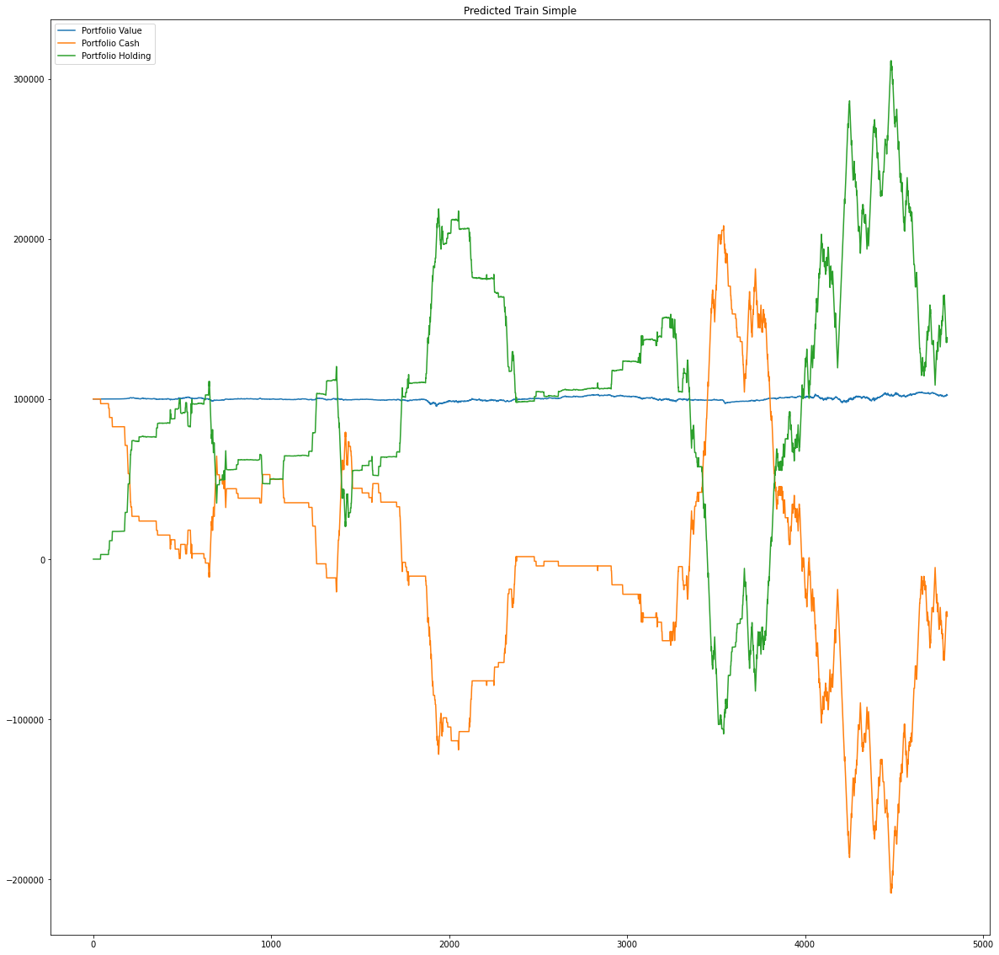

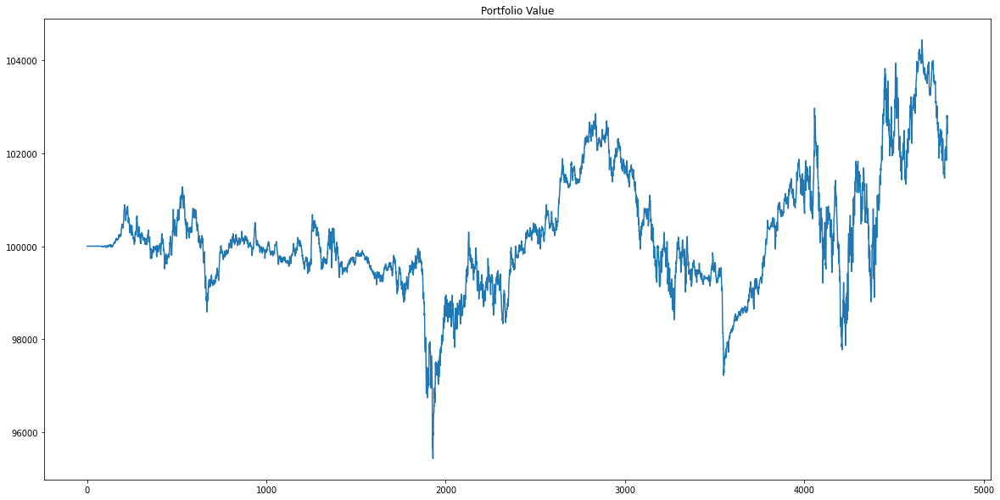

In [25]:
d=pd.DataFrame()
d['close']=data_train.close
d['labels']=y_pred_train
Results['Logreg_Train_Simple']=portfolio_evaluation(d,0,sig_thold,'Predicted Train Simple',0)

In [26]:
print(evaluate_classification(ytrain,y_pred_train))

              precision    recall  f1-score   support

        -1.0       0.11      0.31      0.16       310
         0.0       0.94      0.67      0.78      4186
         1.0       0.15      0.45      0.22       304

    accuracy                           0.63      4800
   macro avg       0.40      0.48      0.39      4800
weighted avg       0.83      0.63      0.70      4800



Return is -0.21587399999983609 % and final holding is -79.0*0.05 BTC
Buys:315, Sells:394, Holds:791
Sharpe Ratio is 0.012871273963344879
Maximum quantities accumulated 120.0


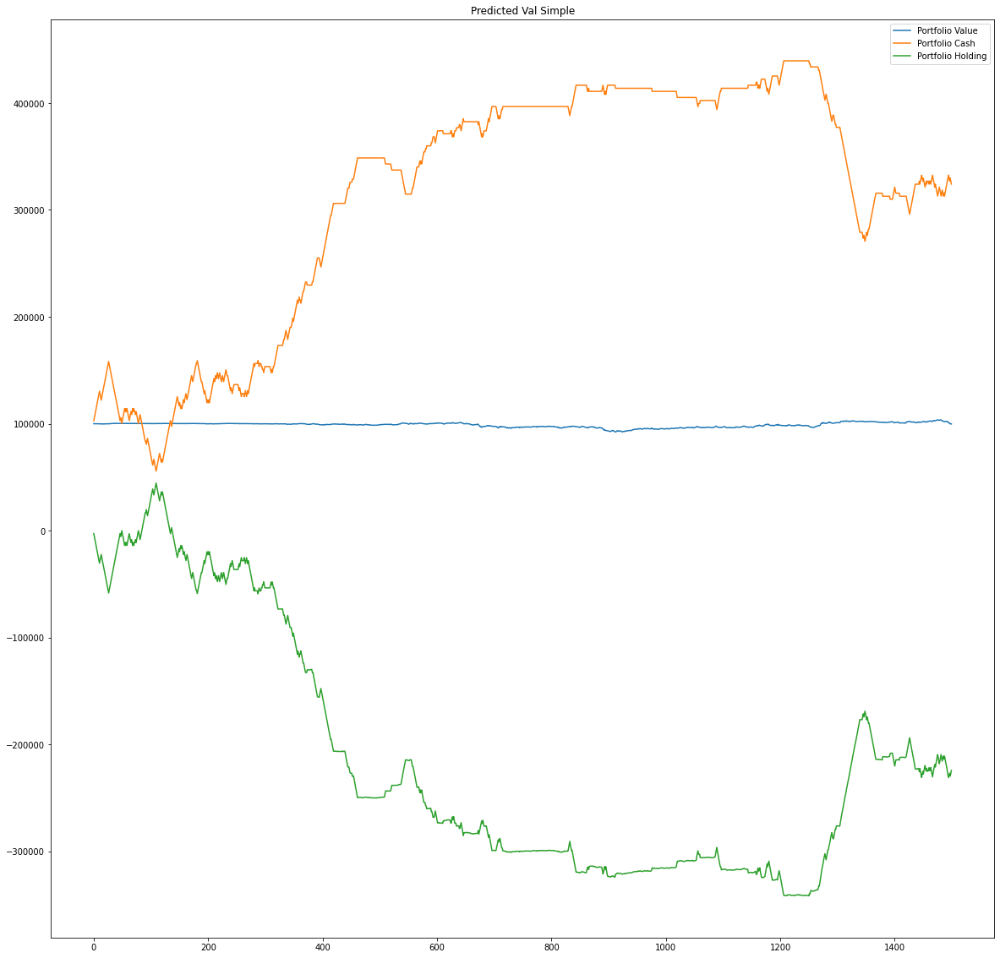

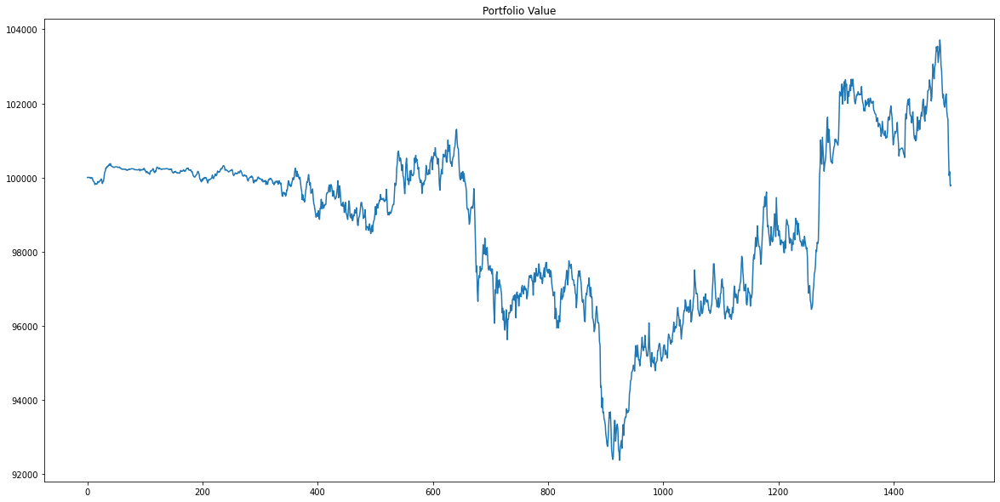

In [27]:
d=pd.DataFrame()
d['close']=data_val.close
d['labels']=y_pred_val
Results['Logreg_val_simple']=portfolio_evaluation(d,0,sig_thold,'Predicted Val Simple',0)

In [28]:
print(evaluate_classification(ytest,y_pred_test))

              precision    recall  f1-score   support

        -1.0       0.19      0.22      0.20       337
         0.0       0.97      0.03      0.06      1058
         1.0       0.20      0.82      0.32       305

    accuracy                           0.21      1700
   macro avg       0.45      0.36      0.19      1700
weighted avg       0.68      0.21      0.13      1700



Return is -86.30350400000205 % and final holding is 872.0*0.05 BTC
Buys:1270, Sells:398, Holds:32
Sharpe Ratio is 0.7745525221060021
Maximum quantities accumulated 872.0


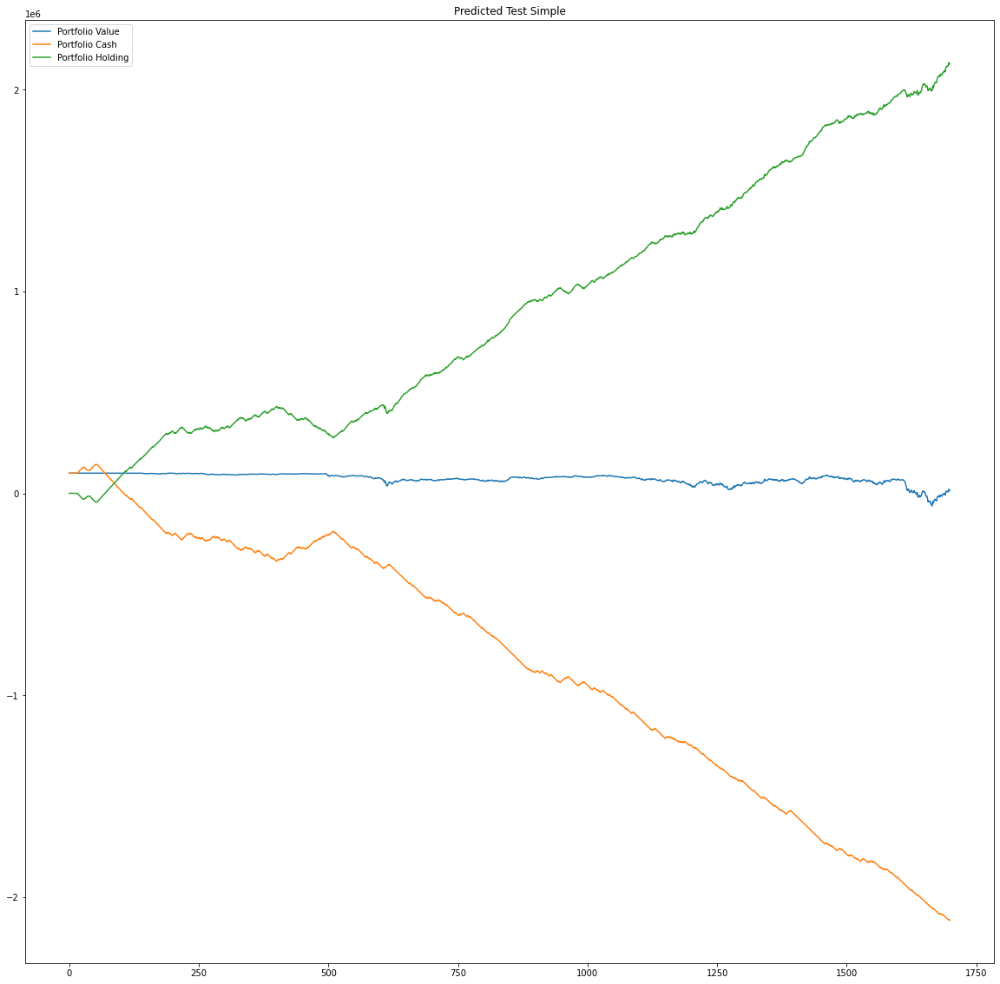

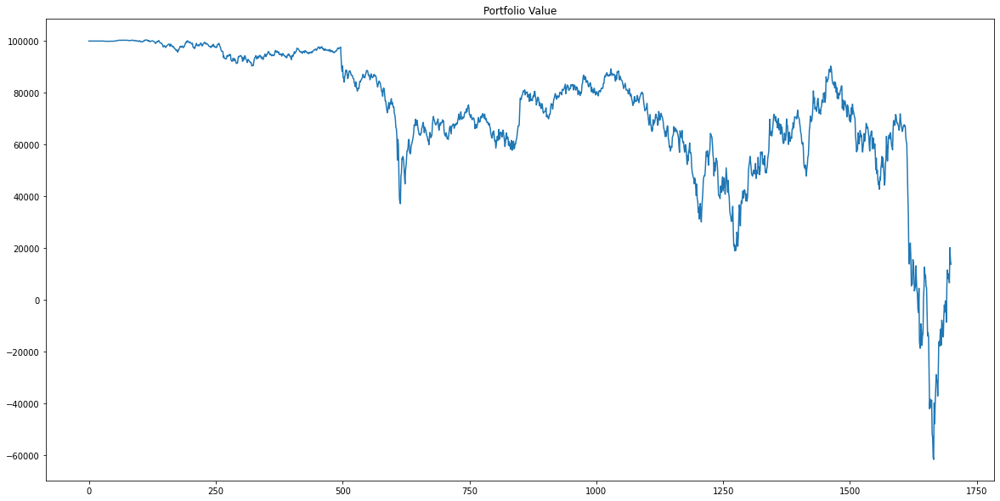

In [29]:
d=pd.DataFrame()
d['close']=data_test.close
d['labels']=y_pred_test
Results['Logreg_test_simple']=portfolio_evaluation(d,0,sig_thold,'Predicted Test Simple',0)

Clearly it is not working in terms of the returns. Let's try RandomForestClassifier on this data.

In [30]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
# rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=50, oob_score = False) 

# param_grid = { 
#      'n_estimators': np.arange(50,700,50).tolist()
# }
# CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
# CV_rfc.fit(scaled_features_train_res, y_train_res)
# print(CV_rfc.best_params_)

In [31]:
rf = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=600, oob_score = False)
rf.fit(scaled_features_train_res,y_train_res)

RandomForestClassifier(n_estimators=600, n_jobs=-1)

In [32]:
y_pred_train_rf = rf.predict(scaled_features_train)
y_pred_val_rf = rf.predict(scaled_features_val)
y_pred_test_rf = rf.predict(scaled_features_test)

In [33]:
print(evaluate_classification(ytrain,y_pred_train_rf))

              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00       310
         0.0       1.00      1.00      1.00      4186
         1.0       1.00      1.00      1.00       304

    accuracy                           1.00      4800
   macro avg       1.00      1.00      1.00      4800
weighted avg       1.00      1.00      1.00      4800



Return is 2.4254590000001772 % and final holding is 50.0*0.05 BTC
Buys:932, Sells:882, Holds:2986
Sharpe Ratio is 0.3084251271220125
Maximum quantities accumulated 112.0


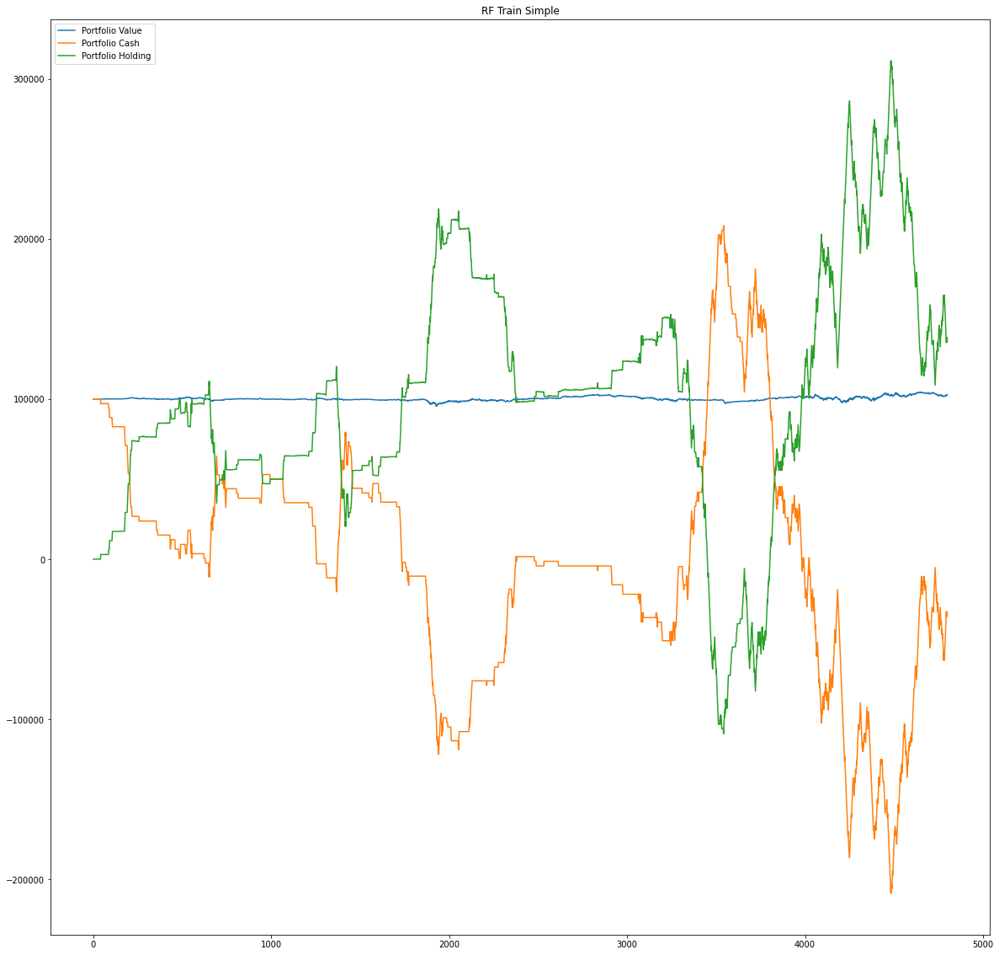

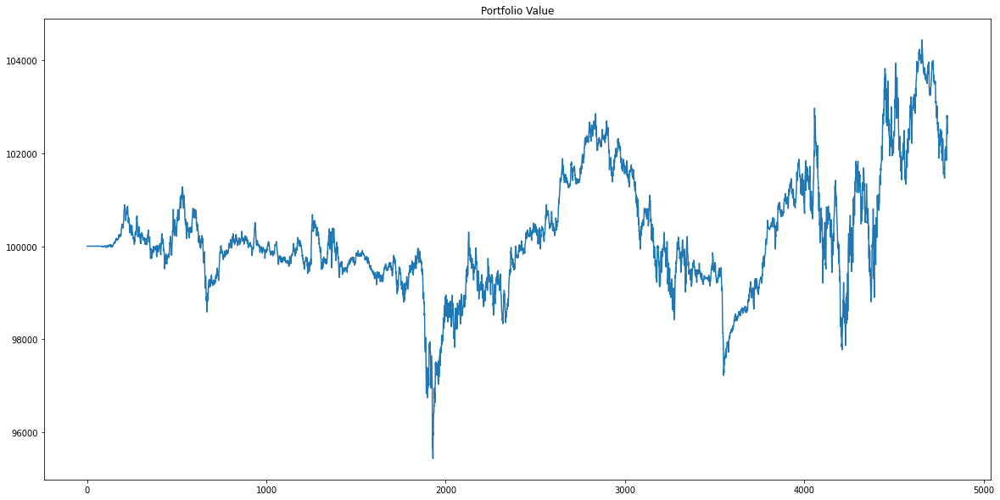

In [34]:
d=pd.DataFrame()
d['close']=data_train.close
d['labels']=y_pred_train
Results['RF_train_simple']=portfolio_evaluation(d,0,sig_thold,'RF Train Simple',0)

In [35]:
print(evaluate_classification(yval,y_pred_val_rf))

              precision    recall  f1-score   support

        -1.0       0.06      0.10      0.08        68
         0.0       0.91      0.87      0.89      1349
         1.0       0.07      0.08      0.08        83

    accuracy                           0.79      1500
   macro avg       0.35      0.35      0.35      1500
weighted avg       0.82      0.79      0.81      1500



Return is -0.21587399999983609 % and final holding is -79.0*0.05 BTC
Buys:315, Sells:394, Holds:791
Sharpe Ratio is 0.012871273963344879
Maximum quantities accumulated 120.0


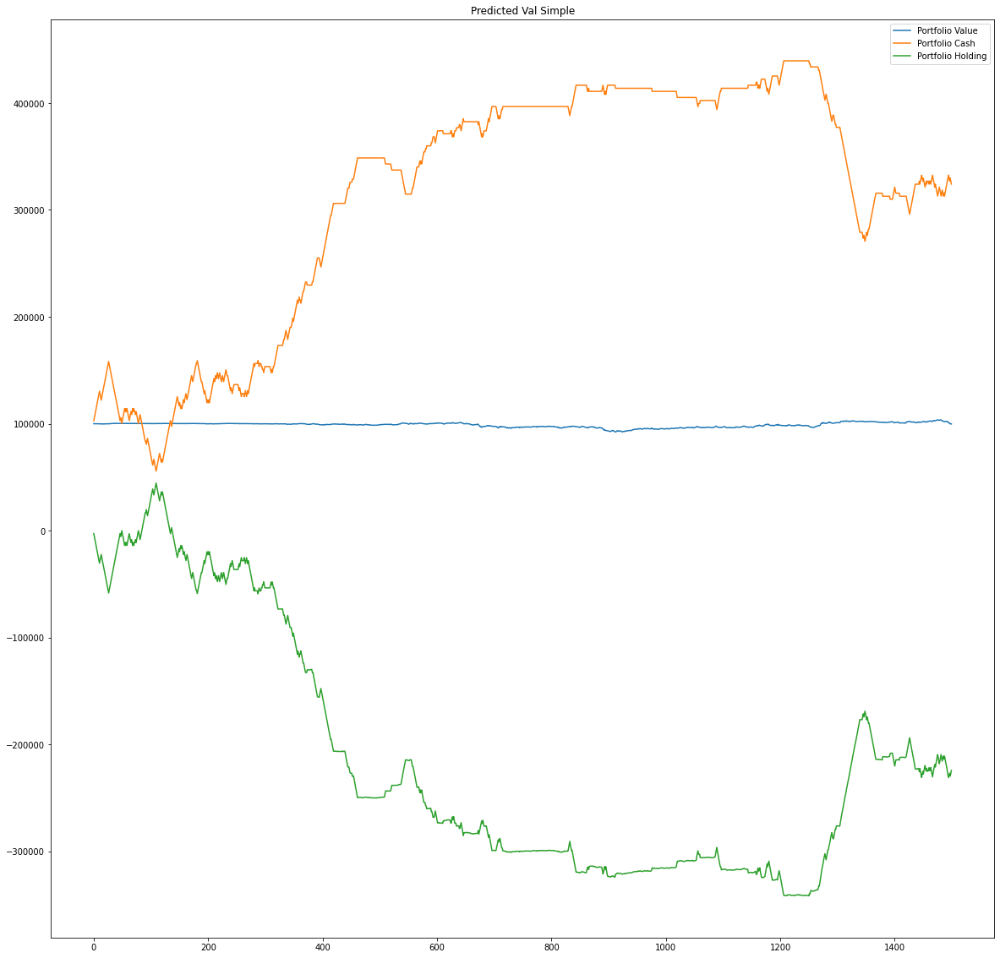

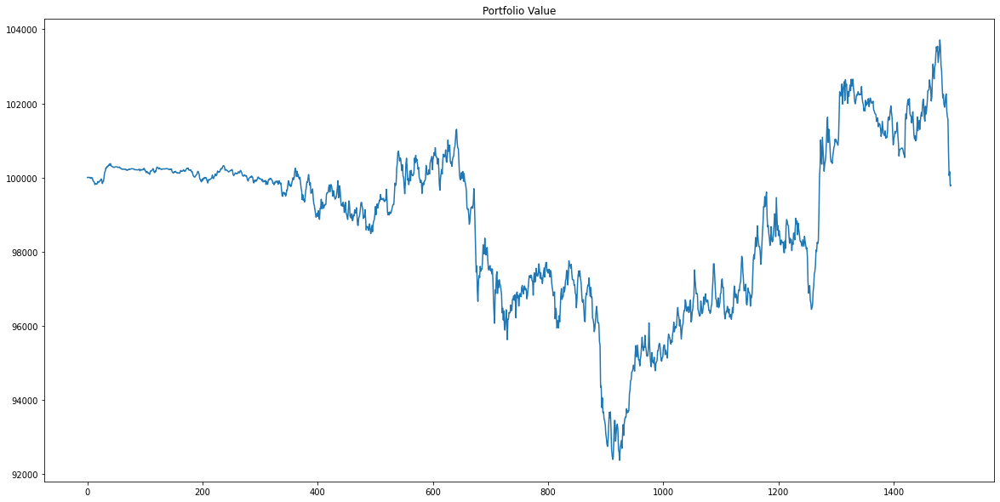

In [36]:
d=pd.DataFrame()
d['close']=data_val.close
d['labels']=y_pred_val
Results['RF_val_simple']=portfolio_evaluation(d,0,sig_thold,'Predicted Val Simple',0)

In [37]:
print(evaluate_classification(ytest,y_pred_test_rf))

              precision    recall  f1-score   support

        -1.0       0.31      0.08      0.12       337
         0.0       0.67      0.74      0.70      1058
         1.0       0.24      0.35      0.28       305

    accuracy                           0.54      1700
   macro avg       0.41      0.39      0.37      1700
weighted avg       0.52      0.54      0.51      1700



Return is -86.30350400000205 % and final holding is 872.0*0.05 BTC
Buys:1270, Sells:398, Holds:32
Sharpe Ratio is 0.7745525221060021
Maximum quantities accumulated 872.0


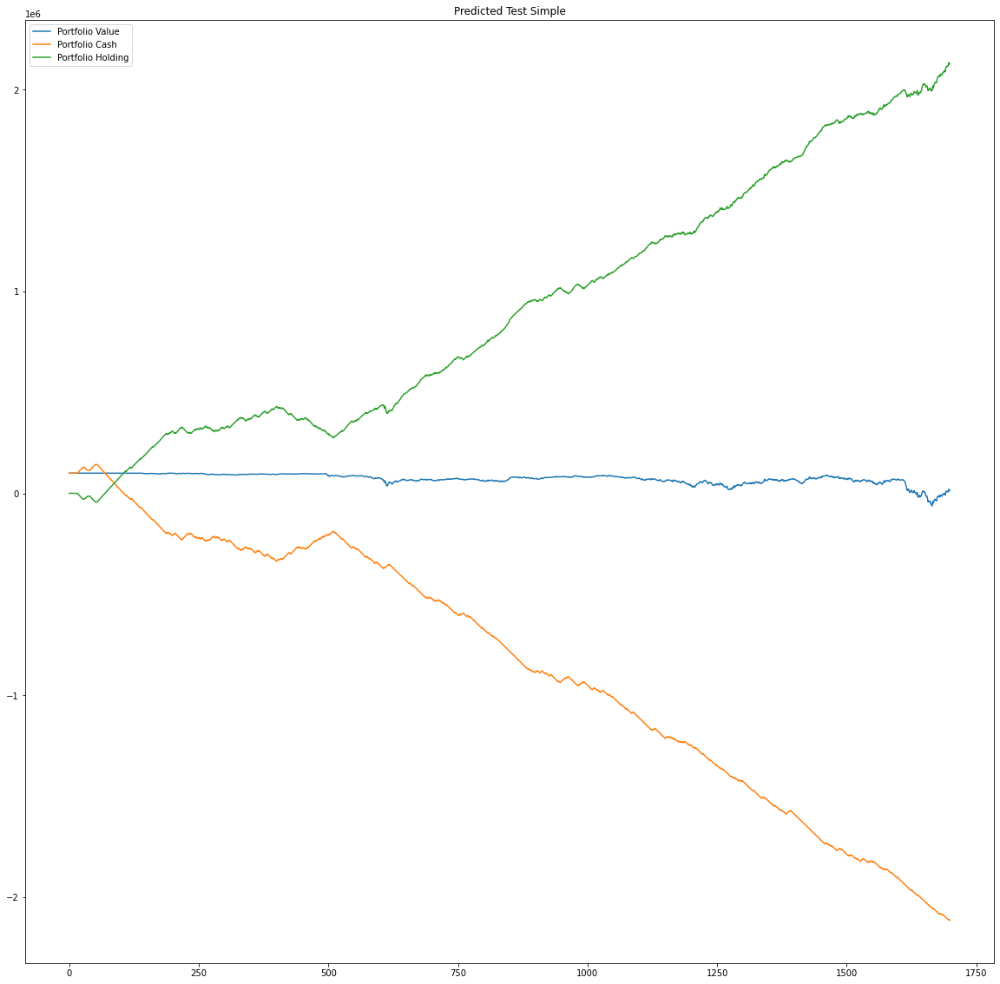

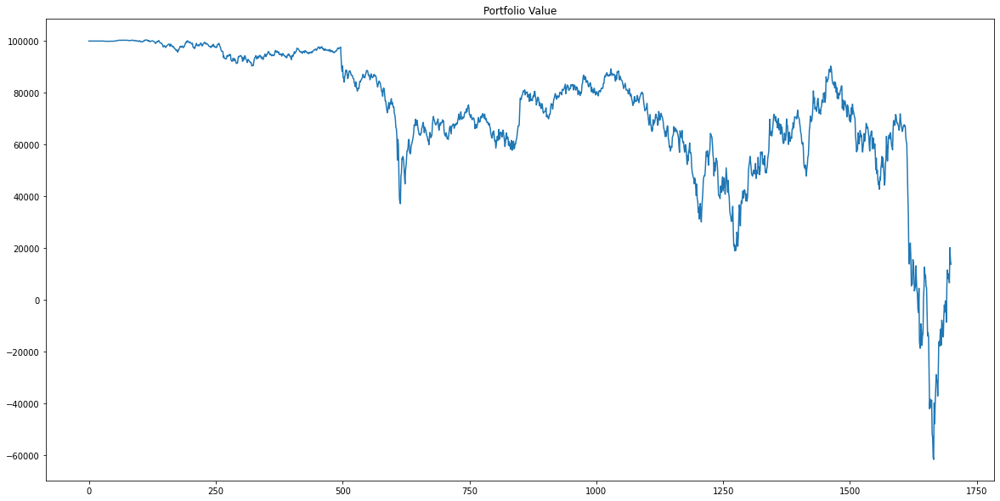

In [38]:
d=pd.DataFrame()
d['close']=data_test.close
d['labels']=y_pred_test
Results['RF_test_simple']=portfolio_evaluation(d,0,sig_thold,'Predicted Test Simple',0)

### Comments:
- Even though the classification results might look good, but implementing those signals on test and validation seem to be bad.
- Problems could be three.
    - Strategy: (These points have been discussed above)
        - The number of quantities to be accumulated.
        - TSL/PB implementation.
        - Too much holding.
    - Indicators:
        - The strat is built on returns but the indicators not entirely return based. This could be causing an issue.
    - ML Model:
        - We have tried just a logistic regression and RandomForestClassifier.
        - There could be other models which could work.


### Strategy 2:
- To tackle the strategy problem of too much accumulation, we are trying a new strategy. The evaluation aspects are similar, just we would be restricting the number of quantities held. Thus we'd be trading more and comparitively holding less.
- Also, incase the return doesn't cross the threshold, it's compared with the previous few returns to see whether it can be considered for buy or not.

In [39]:
def create_labels_position(df,thold,maxpositions):
    total_rows = len(df)
    labels = np.zeros(total_rows)
    returns = df['logreturns']
    position = df['max_positions']
    for i in range(1,len(labels)):
        if abs(position[i-1])<maxpositions:
            if returns[i]>0 and (returns[i]>thold or returns[i]>df['rolling_logreturns'][i-1]):
                labels[i-1]=1
            if returns[i]<0 and (returns[i]<-1*thold or returns[i]<df['rolling_logreturns'][i-1]):
                labels[i-1]=-1
        else:
            if position[i-1]==-1*maxpositions:
                if returns[i]>3*df['rolling_logreturns'][i-1]:
                    labels[i-1]=1
            if position[i-1]==maxpositions:
                if returns[i]<3*df['rolling_logreturns'][i-1]:
                    labels[i-1]=-1
        position[i]=position[i-1]+labels[i-1]
    return labels

In [40]:
max_positions=4

Since the only addition to the initial dataframe is the max_positions, we don't need to generate new variables. Also, the max_positions is a dynamic variable which would be very much dependent on how the trading has happened. So it's excluded. But we have a rolling sum of logreturns which we will be adding to our grand variable set to decide whether we can eliminate that on the basis of correlation or not.

In [41]:
data_train['max_positions']=0
data_val['max_positions']=0
data_test['max_positions']=0

data_train.drop(columns=['returns','logreturns'],inplace=True)
data_val.drop(columns=['returns','logreturns'],inplace=True)
data_test.drop(columns=['returns','logreturns'],inplace=True)

In [42]:
data_train['returns']=data_train['close'].pct_change()
data_train['logreturns']=np.log(data_train['returns']+1)
data_train['rolling_logreturns']=data_train['logreturns'].rolling(7).sum()/3
data_val['returns']=data_val['close'].pct_change()
data_val['logreturns']=np.log(data_val['returns']+1)
data_val['rolling_logreturns']=data_val['logreturns'].rolling(7).sum()/3
data_test['returns']=data_test['close'].pct_change()
data_test['logreturns']=np.log(data_test['returns']+1)
data_test['rolling_logreturns']=data_test['logreturns'].rolling(7).sum()/3

Return is 8.668490499999985 % and final holding is 0.0*0.05 BTC
Buys:1849, Sells:1849, Holds:1102
Sharpe Ratio is 19.216274978024373
Maximum quantities accumulated 4.0


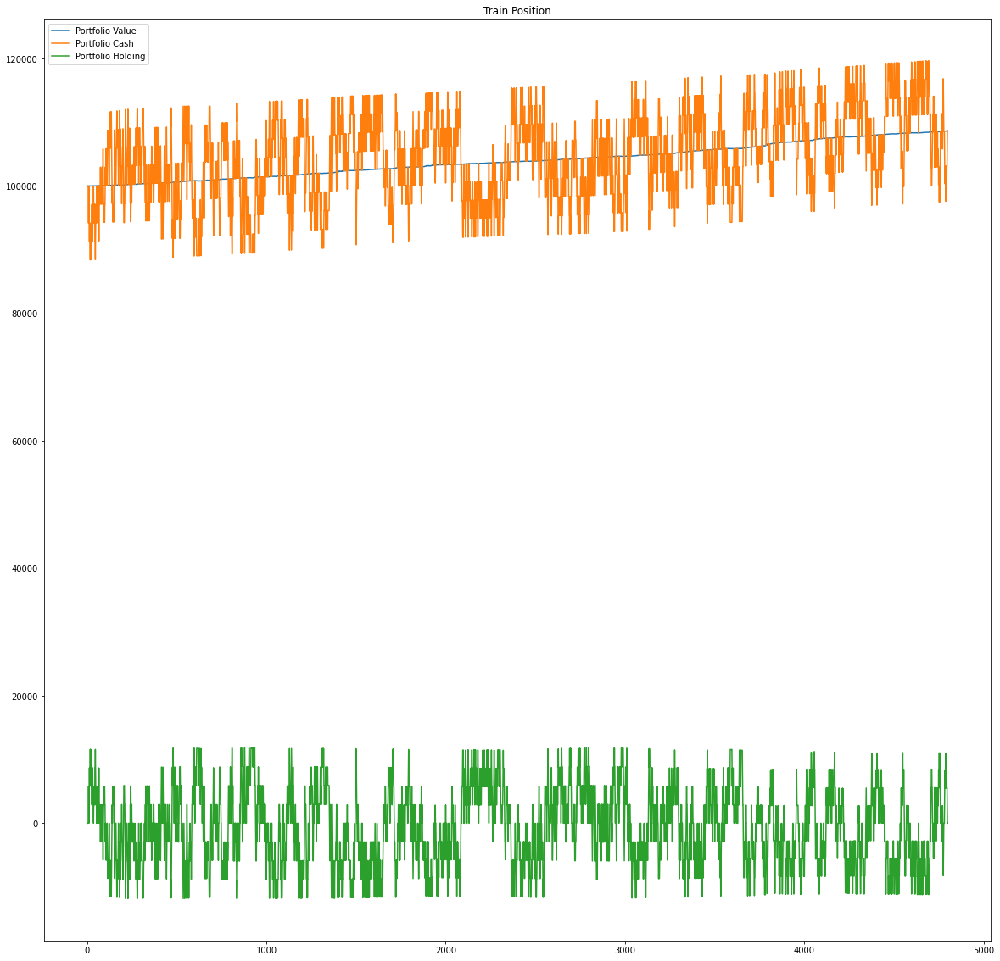

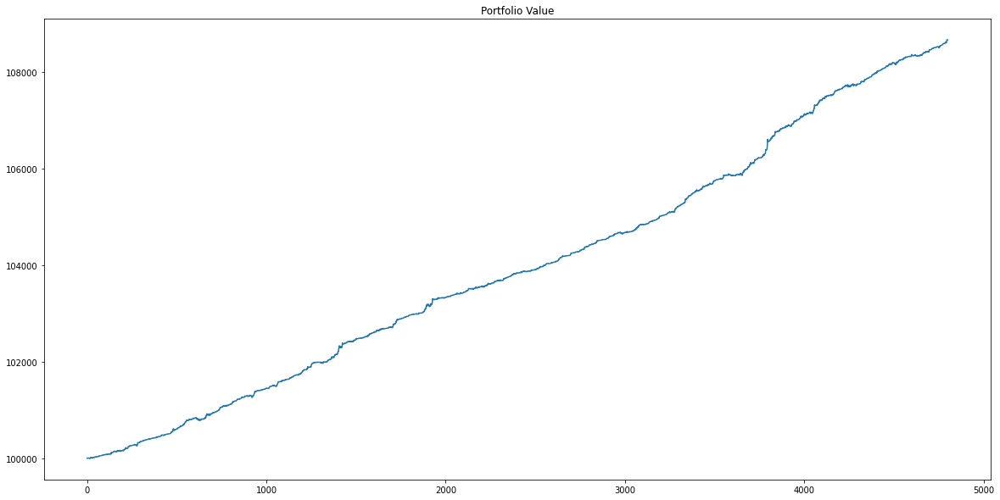

In [43]:
Results['Train_position']=portfolio_evaluation(data_train,create_labels_position,sig_thold,'Train Position',max_positions)

Return is 2.3917005000000064 % and final holding is 0.0*0.05 BTC
Buys:578, Sells:578, Holds:344
Sharpe Ratio is 12.651718841379529
Maximum quantities accumulated 4.0


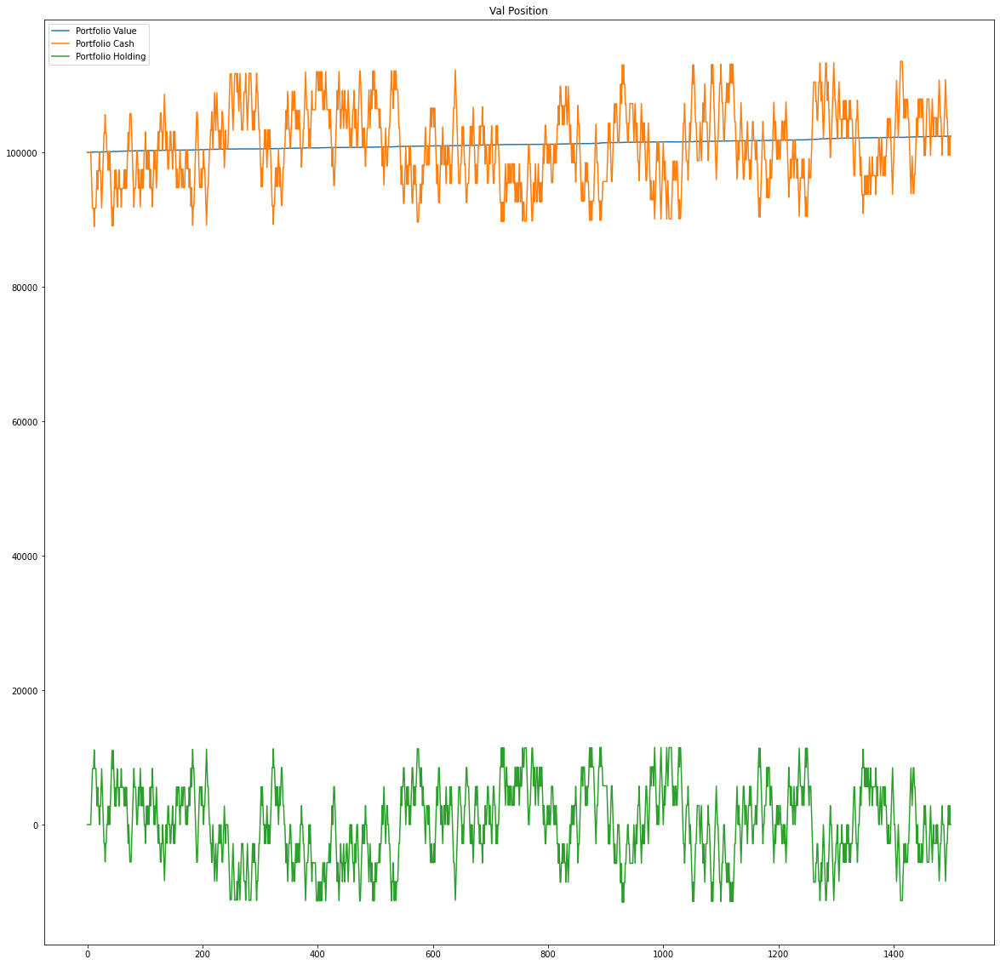

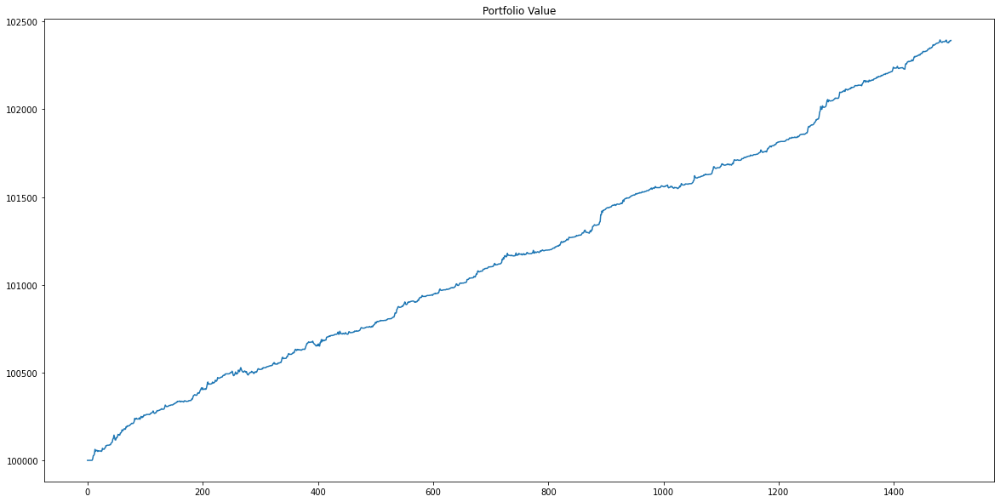

In [44]:
Results['Val_position']=portfolio_evaluation(data_val,create_labels_position,sig_thold,'Val Position',max_positions)

Return is 6.3582715000000025 % and final holding is -4.0*0.05 BTC
Buys:687, Sells:691, Holds:322
Sharpe Ratio is 10.555798513388142
Maximum quantities accumulated 4.0


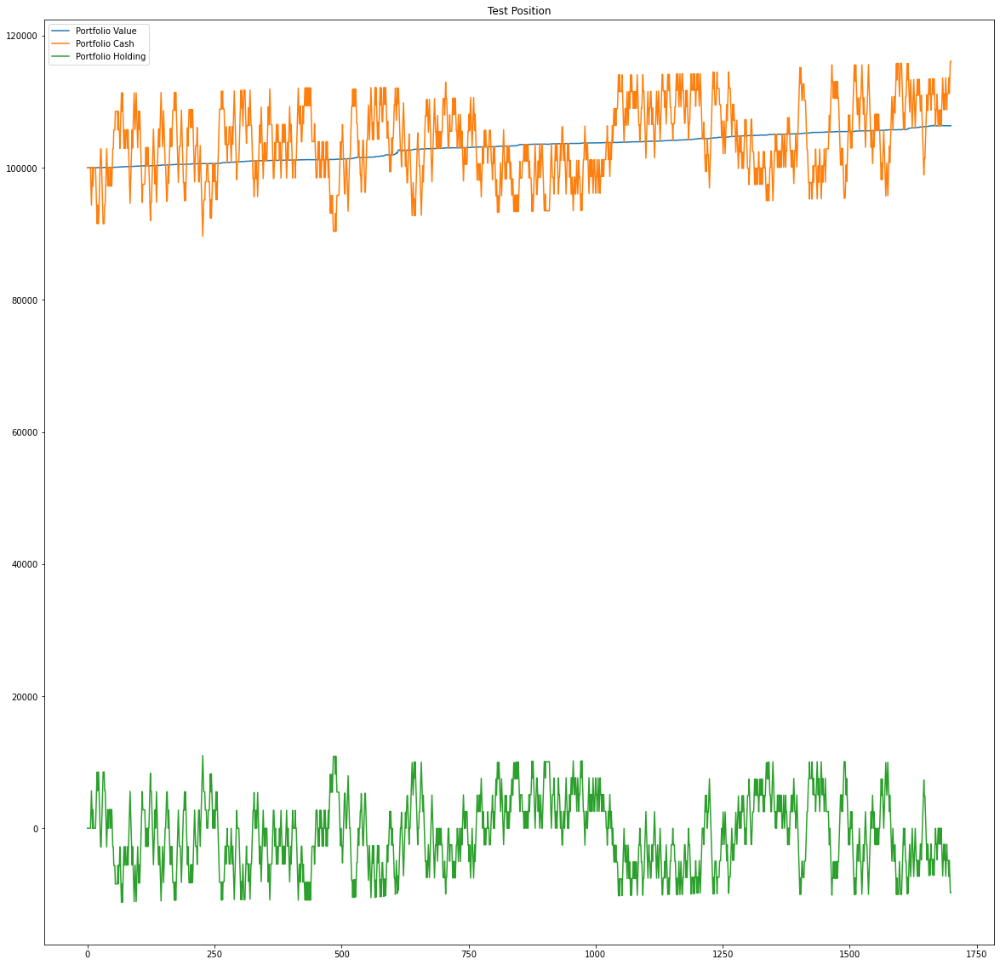

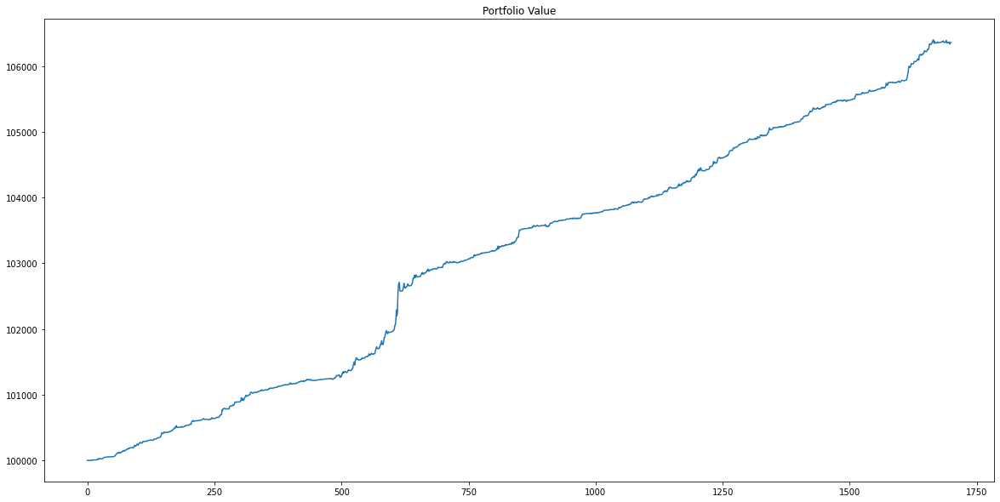

In [45]:
Results['Test_position']=portfolio_evaluation(data_test,create_labels_position,sig_thold,'Test Position',max_positions)

#### This strategy is giving pretty stable returns. Even the sharpe ratio is indicating the same
Also on the training data, we can see that the class imbalance is not high. So we can essentially skip our the things.
We will try if our ML algo's work with this strategy.

In [46]:
df_train = ta.add_all_ta_features(data_train, "open", "high", "low", "close", "volume", fillna=True)
df_val = ta.add_all_ta_features(data_val, "open", "high", "low", "close", "volume", fillna=True)
df_test = ta.add_all_ta_features(data_test, "open", "high", "low", "close", "volume", fillna=True)

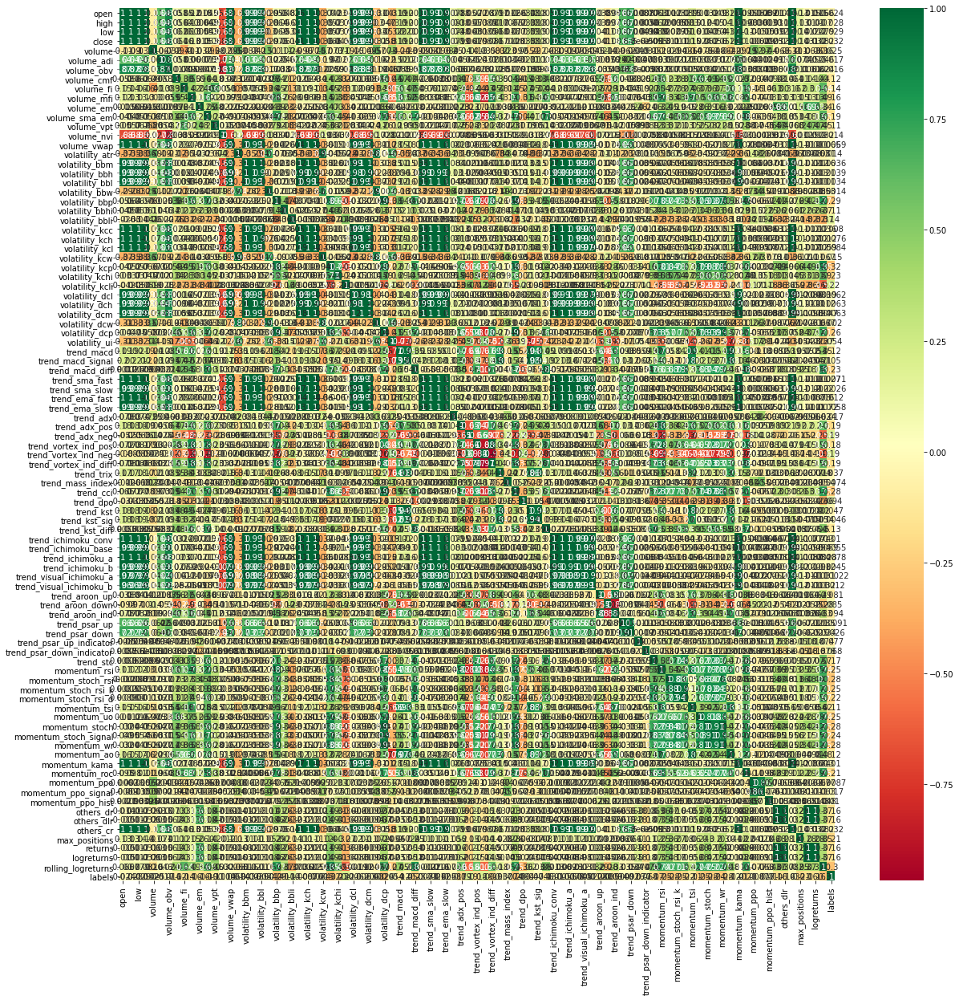

<Figure size 1080x504 with 0 Axes>

In [47]:
# This is where I got the top_corr list. The list of the columns to be dropped.
corrmat = df_train.corr().abs()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df_train[top_corr_features].corr(),annot=True,cmap="RdYlGn")
plt.figure(figsize=(15,7))
upper = corrmat.where(np.triu(np.ones(corrmat.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] >= 0.6)]

In [48]:
to_drop

['high',
 'low',
 'close',
 'volume_adi',
 'volume_obv',
 'volume_sma_em',
 'volume_vpt',
 'volume_nvi',
 'volume_vwap',
 'volatility_bbm',
 'volatility_bbh',
 'volatility_bbl',
 'volatility_bbw',
 'volatility_bbp',
 'volatility_kcc',
 'volatility_kch',
 'volatility_kcl',
 'volatility_kcw',
 'volatility_kcp',
 'volatility_kchi',
 'volatility_kcli',
 'volatility_dcl',
 'volatility_dch',
 'volatility_dcm',
 'volatility_dcw',
 'volatility_dcp',
 'volatility_ui',
 'trend_macd',
 'trend_macd_signal',
 'trend_macd_diff',
 'trend_sma_fast',
 'trend_sma_slow',
 'trend_ema_fast',
 'trend_ema_slow',
 'trend_adx_pos',
 'trend_adx_neg',
 'trend_vortex_ind_pos',
 'trend_vortex_ind_neg',
 'trend_vortex_ind_diff',
 'trend_trix',
 'trend_cci',
 'trend_kst',
 'trend_kst_sig',
 'trend_kst_diff',
 'trend_ichimoku_conv',
 'trend_ichimoku_base',
 'trend_ichimoku_a',
 'trend_ichimoku_b',
 'trend_visual_ichimoku_a',
 'trend_visual_ichimoku_b',
 'trend_aroon_up',
 'trend_aroon_down',
 'trend_aroon_ind',
 'tre

In [49]:
to_retain = list(set(df_train.columns.tolist())-set(to_drop))
print(to_retain)

['volatility_bbhi', 'volume', 'trend_psar_down_indicator', 'volatility_bbli', 'momentum_ppo', 'time', 'volume_em', 'trend_psar_up_indicator', 'trend_adx', 'max_positions', 'volume_fi', 'volume_mfi', 'trend_mass_index', 'labels', 'volume_cmf', 'volatility_atr', 'trend_dpo', 'open', 'momentum_ppo_hist']


In [50]:
Xtrain,ytrain = make_data(df_train,to_drop)
Xval,yval = make_data(df_val,to_drop)
Xtest,ytest=make_data(df_test,to_drop)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_features_train = scaler.fit_transform(Xtrain)
scaled_features_test = scaler.transform(Xtest)
scaled_features_val = scaler.transform(Xval)

In [51]:
from sklearn import  linear_model, metrics 
reg = linear_model.LogisticRegression()    
reg.fit(scaled_features_train, ytrain) 
y_pred_train = reg.predict(scaled_features_train) 
y_pred_val = reg.predict(scaled_features_val)
y_pred_test = reg.predict(scaled_features_test)

In [52]:
print(evaluate_classification(ytrain,y_pred_train))

              precision    recall  f1-score   support

        -1.0       0.49      0.64      0.56      1849
         0.0       0.36      0.00      0.01      1102
         1.0       0.50      0.64      0.56      1849

    accuracy                           0.49      4800
   macro avg       0.45      0.43      0.38      4800
weighted avg       0.47      0.49      0.43      4800



Return is 29.969658499999714 % and final holding is -27.0*0.05 BTC
Buys:2381, Sells:2408, Holds:11
Sharpe Ratio is 2.0485880297734425
Maximum quantities accumulated 192.0


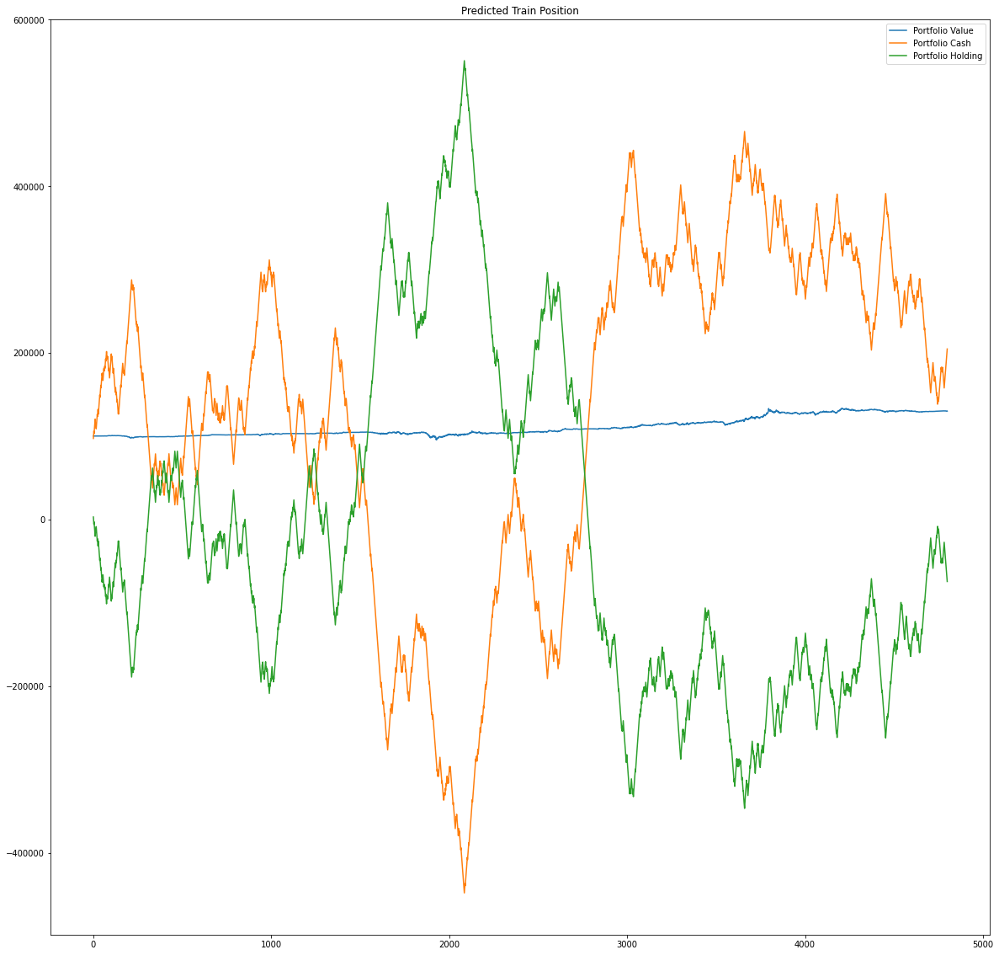

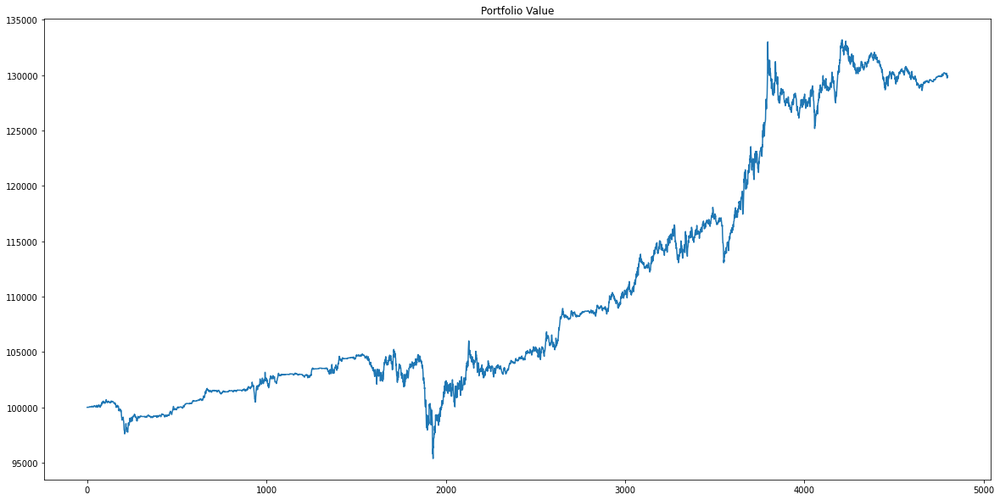

In [53]:
d=pd.DataFrame()
d['close']=data_train.close
d['labels']=y_pred_train
Results['logreg_train_position']=portfolio_evaluation(d,0,sig_thold,'Predicted Train Position',4)

In [54]:
print(evaluate_classification(yval,y_pred_val))

              precision    recall  f1-score   support

        -1.0       0.49      0.62      0.55       578
         0.0       0.50      0.00      0.01       344
         1.0       0.49      0.64      0.55       578

    accuracy                           0.49      1500
   macro avg       0.49      0.42      0.37      1500
weighted avg       0.49      0.49      0.43      1500



Return is 5.359267500000191 % and final holding is 32.0*0.05 BTC
Buys:765, Sells:733, Holds:2
Sharpe Ratio is 1.4666240093015475
Maximum quantities accumulated 95.0


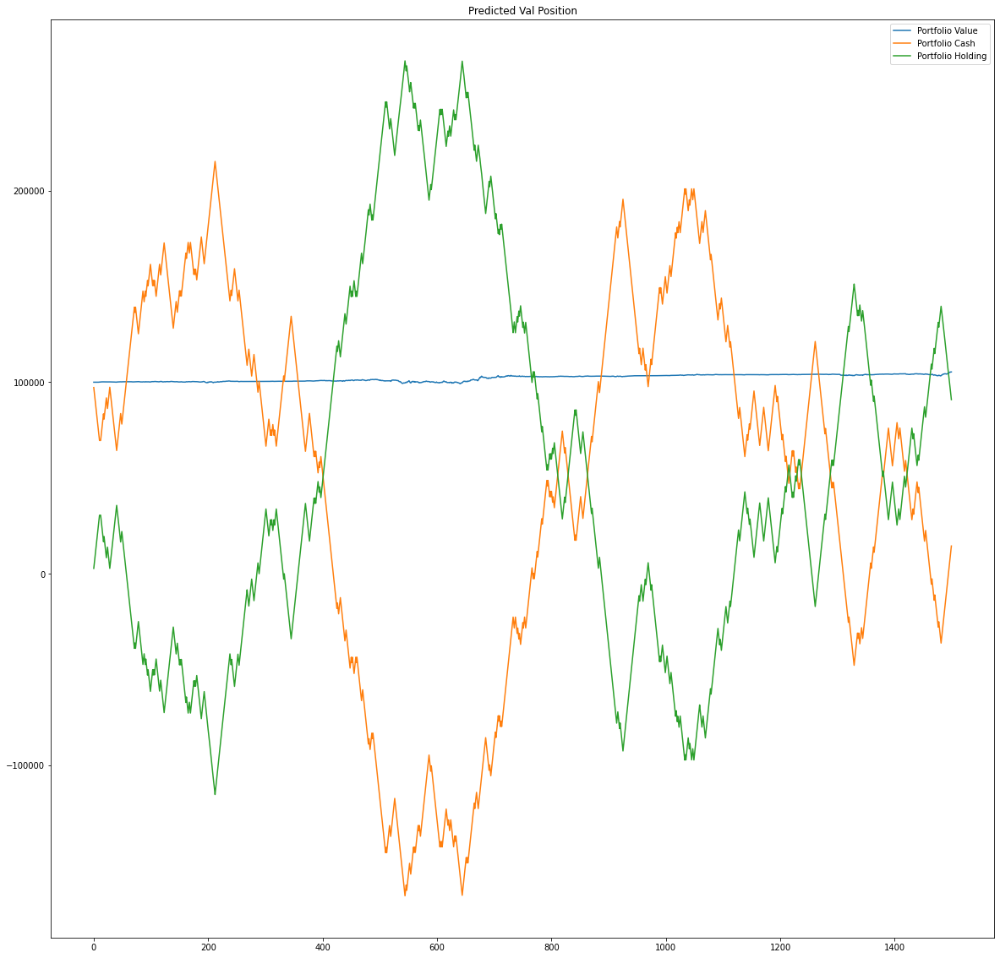

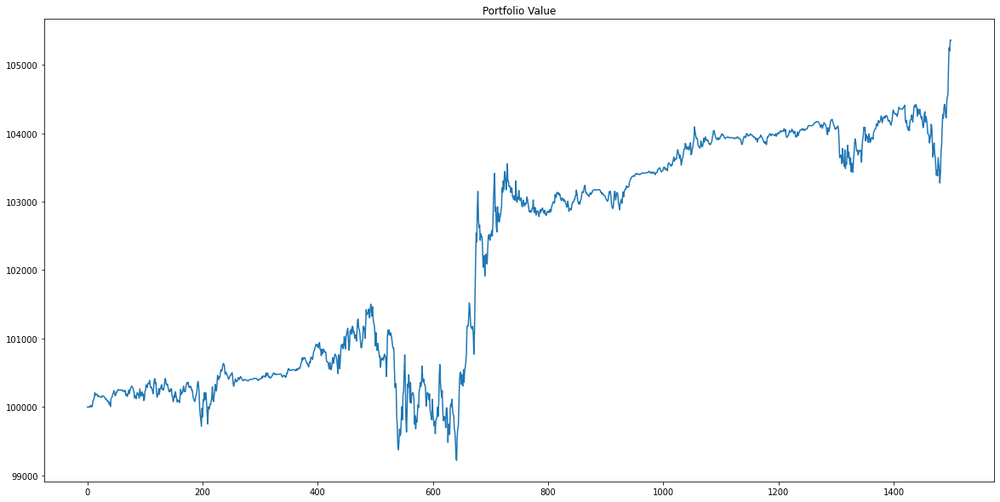

In [55]:
d=pd.DataFrame()
d['close']=data_val.close
d['labels']=y_pred_val
Results['Logreg_val_position']=portfolio_evaluation(d,0,sig_thold,'Predicted Val Position',4)

Return is -32.987975500000175 % and final holding is 158.0*0.05 BTC
Buys:921, Sells:763, Holds:16
Sharpe Ratio is -0.3487158495223547
Maximum quantities accumulated 205.0


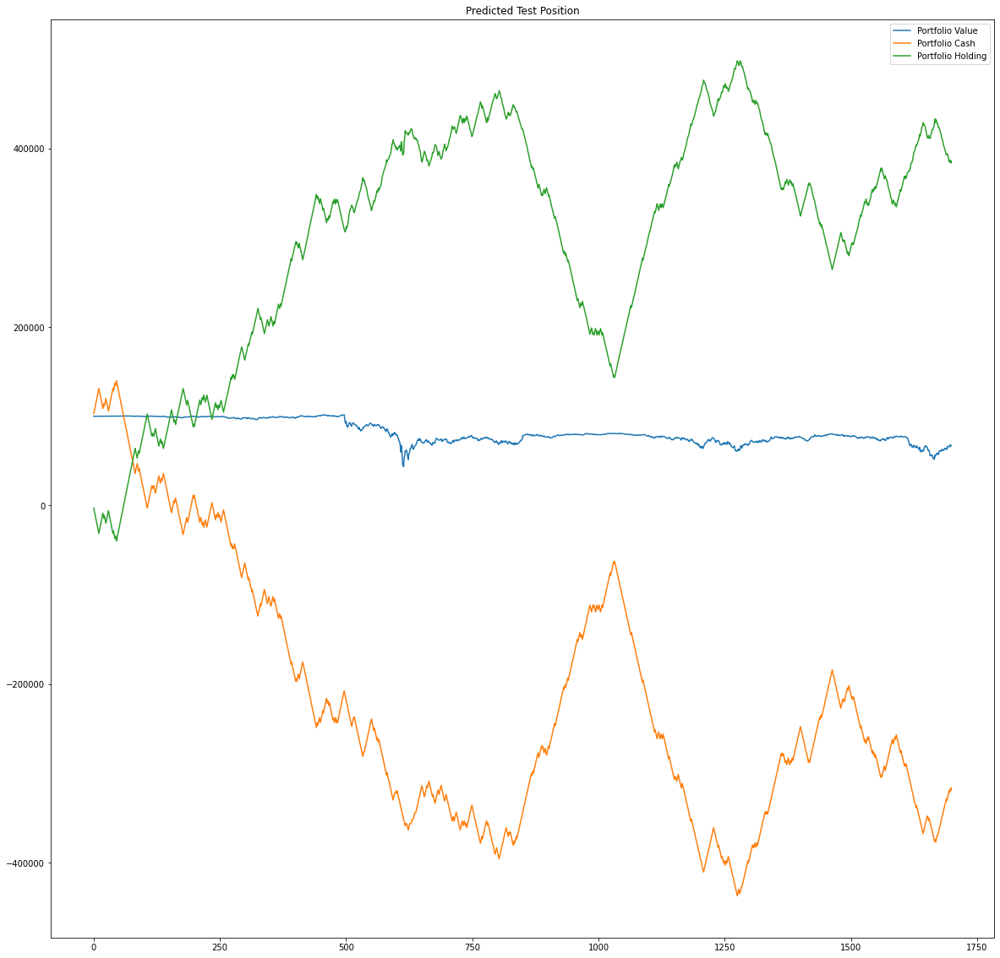

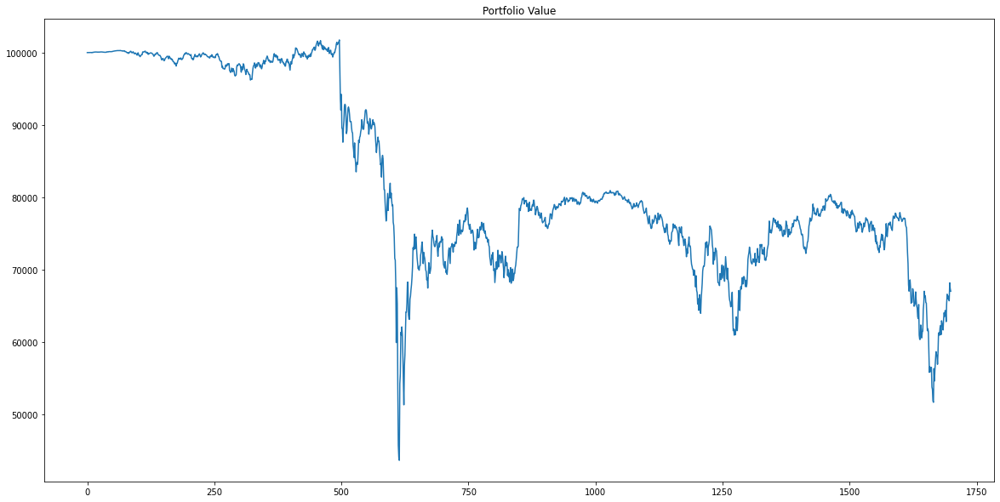

In [56]:
d=pd.DataFrame()
d['close']=data_test.close
d['labels']=y_pred_test
Results['Logreg_test_position']=portfolio_evaluation(d,0,sig_thold,'Predicted Test Position',4)

In [57]:
print(evaluate_classification(ytest,y_pred_test))

              precision    recall  f1-score   support

        -1.0       0.50      0.55      0.52       691
         0.0       0.06      0.00      0.01       322
         1.0       0.49      0.66      0.56       687

    accuracy                           0.49      1700
   macro avg       0.35      0.40      0.36      1700
weighted avg       0.41      0.49      0.44      1700



Again we try with RandomForestClassifier

In [58]:
# rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=50, oob_score = False) 

# param_grid = { 
#      'n_estimators': np.arange(50,700,50).tolist()
# }
# CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, cv= 5)
# CV_rfc.fit(scaled_features_train, ytrain)
# print(CV_rfc.best_params_)

In [59]:
rf = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=300, oob_score = False)
rf.fit(scaled_features_train,ytrain)

RandomForestClassifier(n_estimators=300, n_jobs=-1)

In [60]:
y_pred_train_rf = rf.predict(scaled_features_train)
y_pred_val_rf = rf.predict(scaled_features_val)
y_pred_test_rf = rf.predict(scaled_features_test)

In [61]:
print(evaluate_classification(ytrain,y_pred_train_rf))

              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00      1849
         0.0       1.00      1.00      1.00      1102
         1.0       1.00      1.00      1.00      1849

    accuracy                           1.00      4800
   macro avg       1.00      1.00      1.00      4800
weighted avg       1.00      1.00      1.00      4800



Return is 8.668490499999985 % and final holding is 0.0*0.05 BTC
Buys:1849, Sells:1849, Holds:1102
Sharpe Ratio is 19.216274978024373
Maximum quantities accumulated 4.0


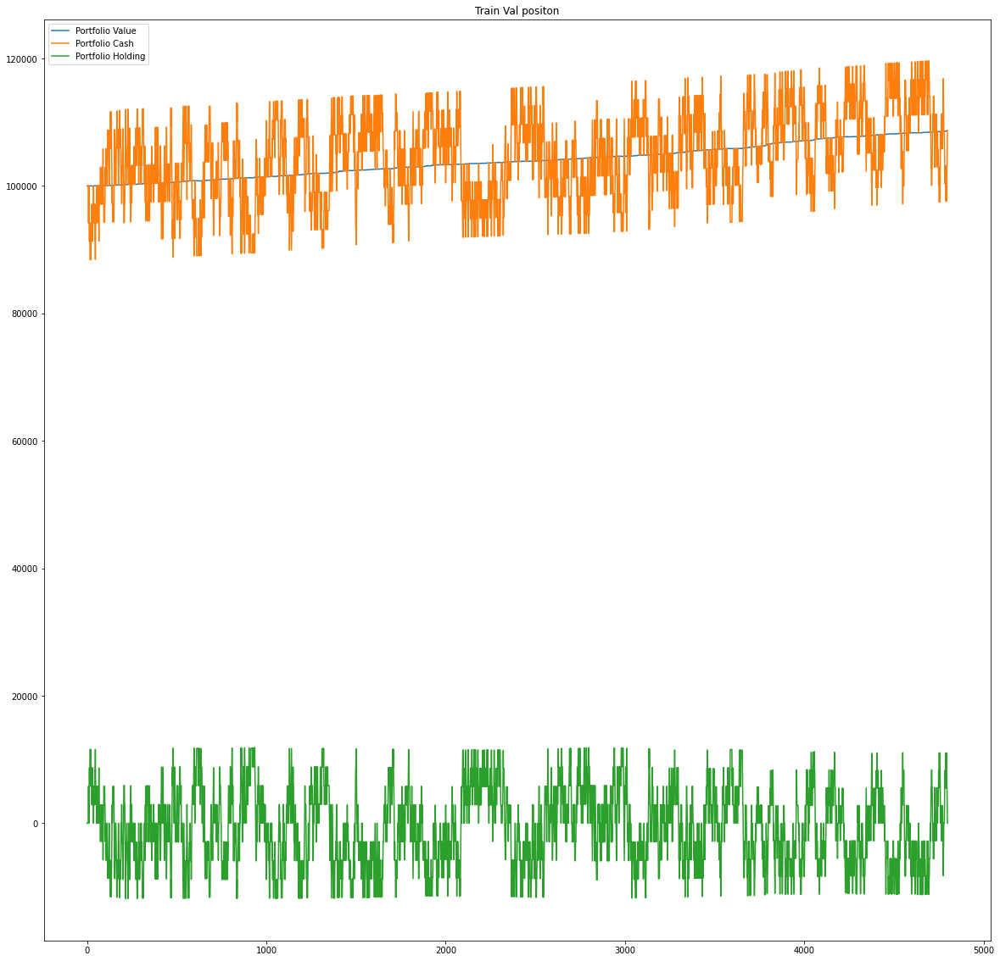

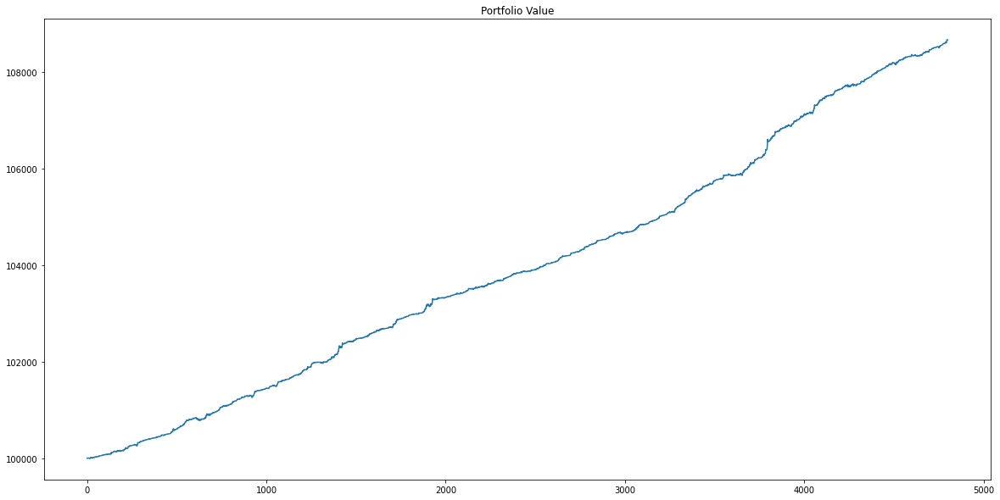

In [62]:
d=pd.DataFrame()
d['close']=data_train.close
d['labels']=y_pred_train_rf
Results['Train_val_position']=portfolio_evaluation(d,0,sig_thold,'Train Val positon',4)

In [63]:
print(evaluate_classification(yval,y_pred_val_rf))

              precision    recall  f1-score   support

        -1.0       0.49      0.60      0.54       578
         0.0       0.56      0.04      0.08       344
         1.0       0.50      0.66      0.57       578

    accuracy                           0.50      1500
   macro avg       0.52      0.44      0.40      1500
weighted avg       0.51      0.50      0.45      1500



Return is 1.2162445000000297 % and final holding is 57.0*0.05 BTC
Buys:766, Sells:709, Holds:25
Sharpe Ratio is 0.3164099570384637
Maximum quantities accumulated 84.0


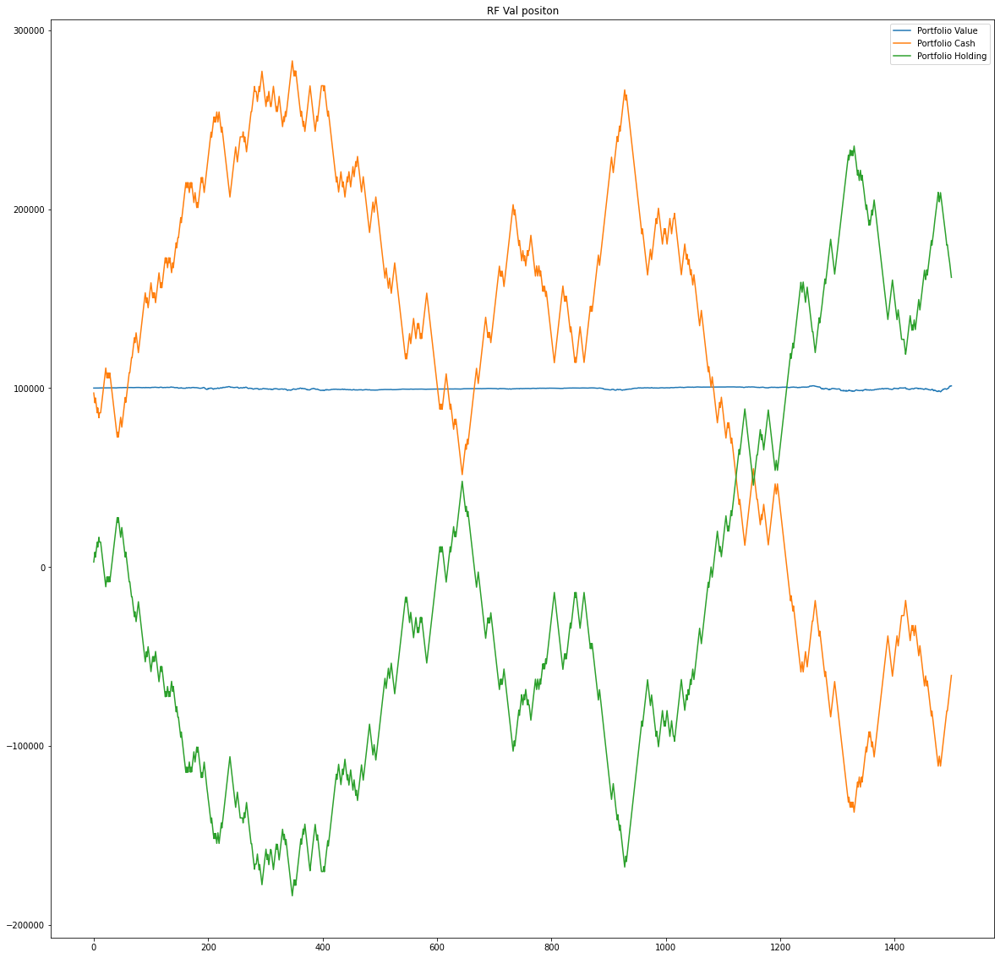

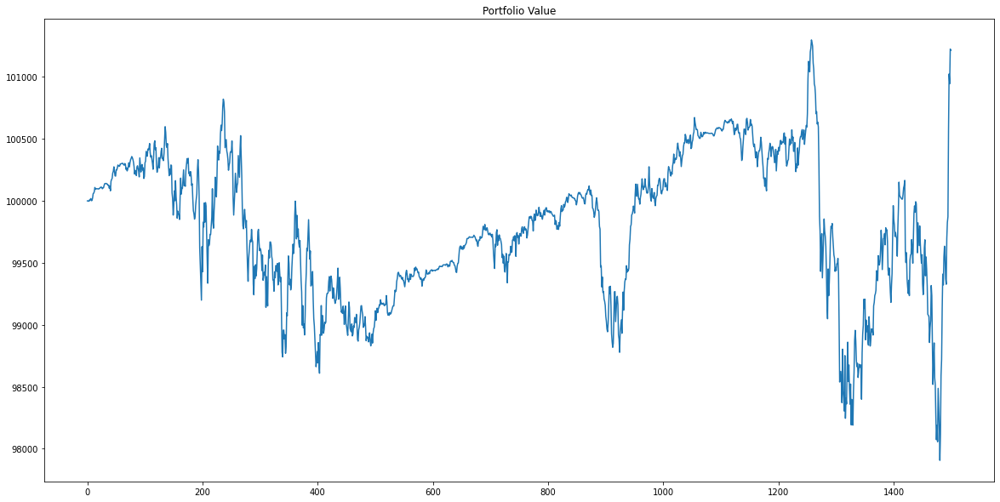

In [64]:
d=pd.DataFrame()
d['close']=data_val.close
d['labels']=y_pred_val_rf
Results['RF_val_position']=portfolio_evaluation(d,0,sig_thold,'RF Val positon',4)

In [65]:
print(evaluate_classification(ytest,y_pred_test_rf))

              precision    recall  f1-score   support

        -1.0       0.53      0.55      0.54       691
         0.0       0.44      0.08      0.14       322
         1.0       0.51      0.68      0.59       687

    accuracy                           0.52      1700
   macro avg       0.49      0.44      0.42      1700
weighted avg       0.50      0.52      0.48      1700



Return is -37.79895600000094 % and final holding is 197.0*0.05 BTC
Buys:919, Sells:722, Holds:59
Sharpe Ratio is -0.27254137948083557
Maximum quantities accumulated 237.0


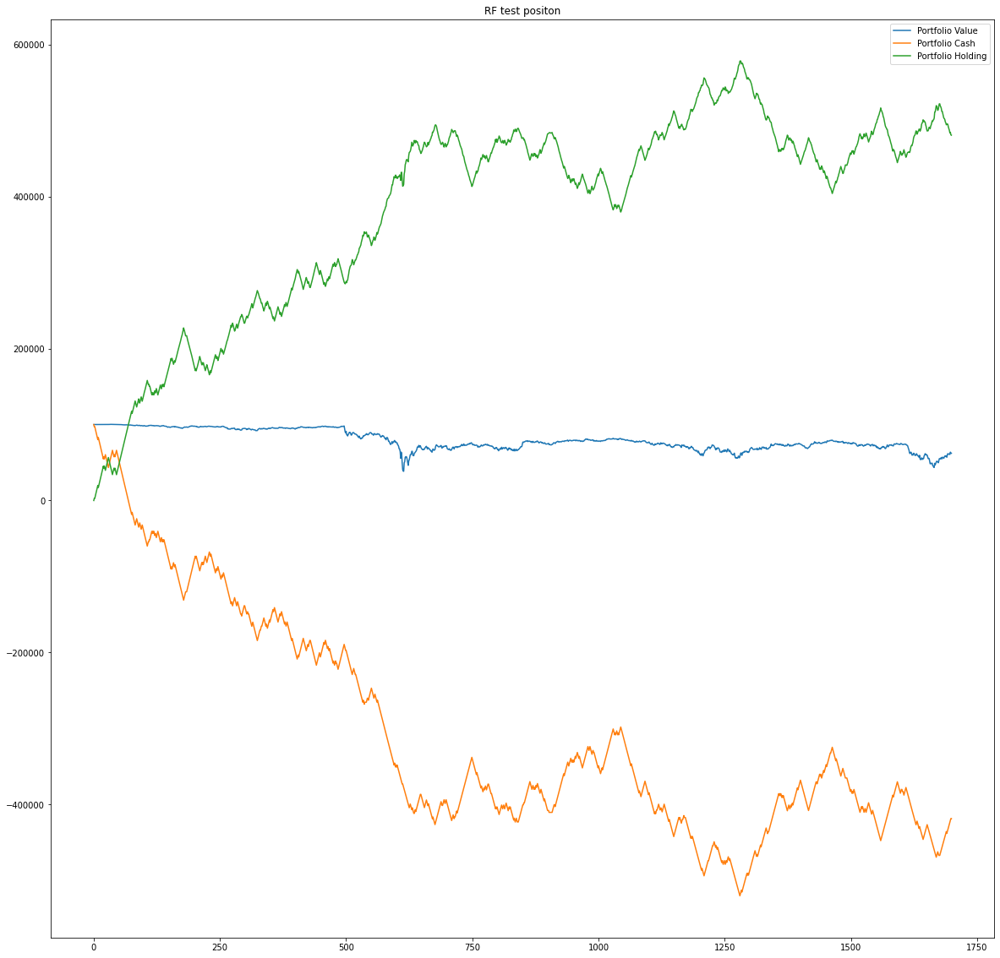

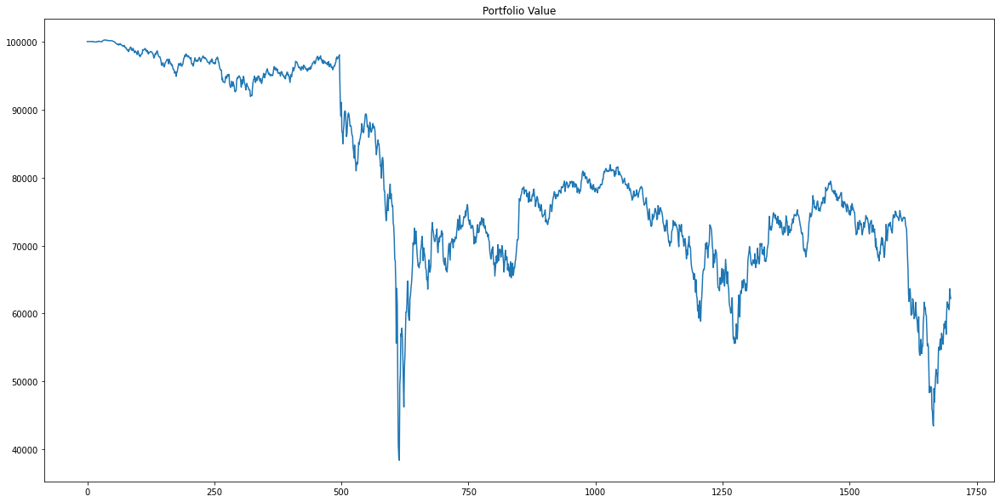

In [66]:
d=pd.DataFrame()
d['close']=data_test.close
d['labels']=y_pred_test_rf
Results['RF_test_position']=portfolio_evaluation(d,0,sig_thold,'RF test positon',4)

## Comments

Now having seen all these, the ML part is clearly not working. Especially for the position strategy. 
However, the strategy is really good. It can be deployed provided the forecasted return is estimated correctly. It has minimum risk and doesn't hold position longer. Yes, we could be possibly missing out on big chunks of profit, but the risk is low.

In [67]:
data_train['max_positions']=0
data_val['max_positions']=0
data_test['max_positions']=0

data_train.drop(columns=['returns','logreturns'],inplace=True)
data_val.drop(columns=['returns','logreturns'],inplace=True)
data_test.drop(columns=['returns','logreturns'],inplace=True)

In [68]:
data_train['returns']=data_train['close'].pct_change()
data_train['logreturns']=np.log(data_train['returns']+1)
data_train['rolling_logreturns']=data_train['logreturns'].rolling(7).sum()/3
data_val['returns']=data_val['close'].pct_change()
data_val['logreturns']=np.log(data_val['returns']+1)
data_val['rolling_logreturns']=data_val['logreturns'].rolling(7).sum()/3
data_test['returns']=data_test['close'].pct_change()
data_test['logreturns']=np.log(data_test['returns']+1)
data_test['rolling_logreturns']=data_test['logreturns'].rolling(7).sum()/3

In [69]:
columns1=['open','high','low','close','volume','logreturns']
Xtrain=pd.DataFrame(columns=['open','high','low','close','volume','logreturns'])
Xval=pd.DataFrame(columns=['open','high','low','close','volume','logreturns'])
Xtest=pd.DataFrame(columns=['open','high','low','close','volume','logreturns'])

In [70]:
for i in columns1:
    Xtrain[i]=np.asarray(data_train[i])
    Xval[i]=np.asarray(data_val[i])
    Xtest[i]=np.asarray(data_test[i])

In [71]:
l = data_train['logreturns'].values
l[0]=0

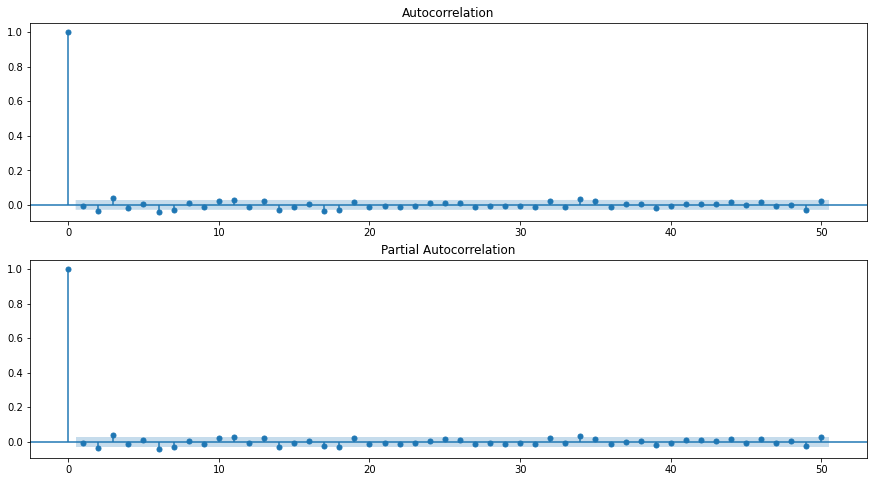

In [72]:
fig,ax = plt.subplots(2,1,figsize=(15,8))
fig = plot_acf(l, lags=50, ax=ax[0])
fig = plot_pacf(l, lags=50, ax=ax[1],method='ywmle')
plt.show()

Series seems uncorrelated with the past.

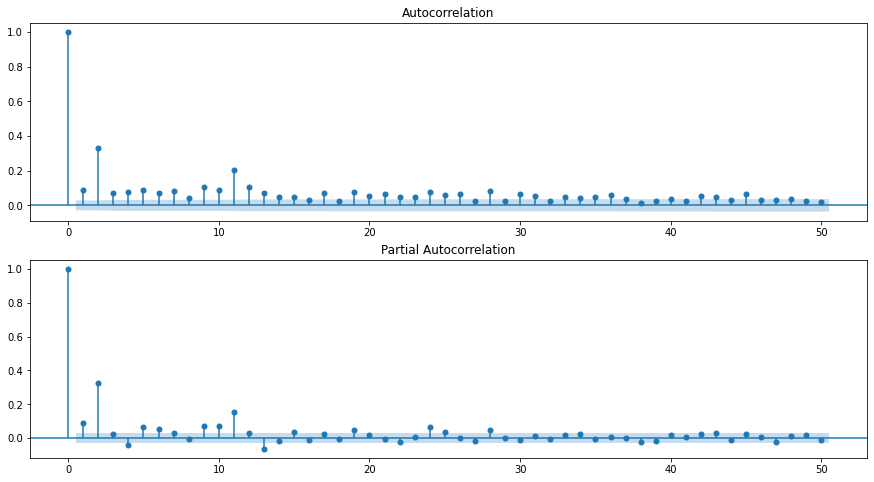

In [73]:
fig,ax = plt.subplots(2,1,figsize=(15,8))
fig = plot_acf(l**2, lags=50, ax=ax[0])
fig = plot_pacf(l**2, lags=50, ax=ax[1],method='ywmle')
plt.show()

By checking the squared logreturns we understand that the though the series may seem uncorrelated to the past returns but is dependent. So this is leading to modeling using the ARCH OR GARCH Process for forecasting the volatility and accordingly the return. So this is just  a preliminary approach to check that.

That is a way to go forward but what I'd be trying here is to use a small window of rolling return standard deviation (an extremely crude estimate of the std of the return) for generating the buy and sell signals.

In [74]:
def makeindicators(df):
    A = []
    for i in range(1,3):
        m=df['logreturns'].shift(i).values
        A.append(m/i)
    for i in range(1,6):
        n=df['logreturns'].shift(i).values
        A.append(n**2/i) 
    l = df['logreturns'].rolling(7).sum().values
    A.append(l/3)
    m = df['logreturns'].rolling(8).std().values
    A.append(m)
    vol = df['volume'].diff().values
    A.append(vol)
    l = df['close'].values
    l = (l-np.mean(l))/np.std(l)
    A.append(l)
    return np.asarray(A).T

In [75]:
features_train=makeindicators(Xtrain)
features_train = np.nan_to_num(features_train,0)
scaler = StandardScaler()
scaled_features_train = scaler.fit_transform(features_train)
features_val=makeindicators(Xval)
features_val = np.nan_to_num(features_val,0)
scaled_features_val = scaler.transform(features_val)
features_test=makeindicators(Xtest)
features_test = np.nan_to_num(features_test,0)
scaled_features_test = scaler.transform(features_test)

In [76]:
model = RandomForestClassifier(n_jobs=-1,max_features='auto',n_estimators=300)

In [77]:
model.fit(scaled_features_train,ytrain)
ytrain_hat_rf = model.predict(scaled_features_train)
yval_hat_rf = model.predict(scaled_features_val)
ytest_hat_rf = model.predict(scaled_features_test)

In [78]:
print(evaluate_classification(ytrain,ytrain_hat_rf))

              precision    recall  f1-score   support

        -1.0       1.00      1.00      1.00      1849
         0.0       1.00      1.00      1.00      1102
         1.0       1.00      1.00      1.00      1849

    accuracy                           1.00      4800
   macro avg       1.00      1.00      1.00      4800
weighted avg       1.00      1.00      1.00      4800



Return is 8.668490499999985 % and final holding is 0.0*0.05 BTC
Buys:1849, Sells:1849, Holds:1102
Sharpe Ratio is 19.216274978024373
Maximum quantities accumulated 4.0


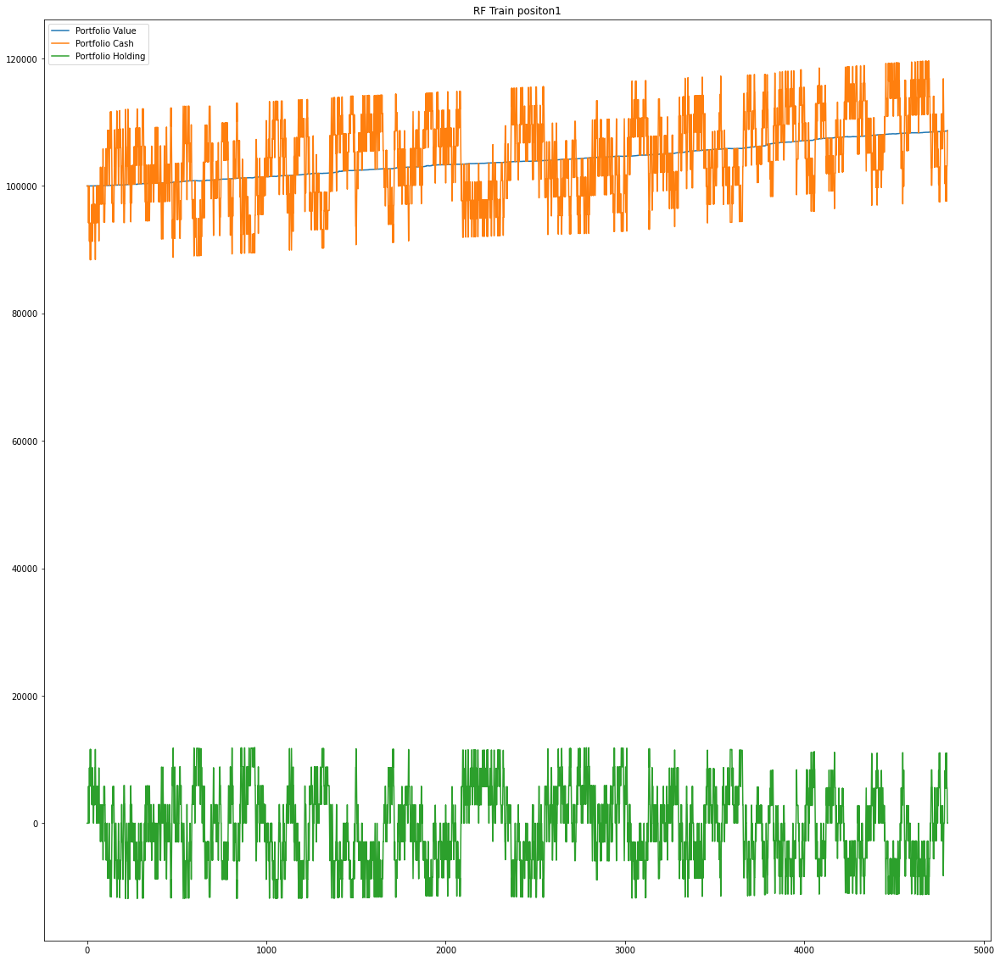

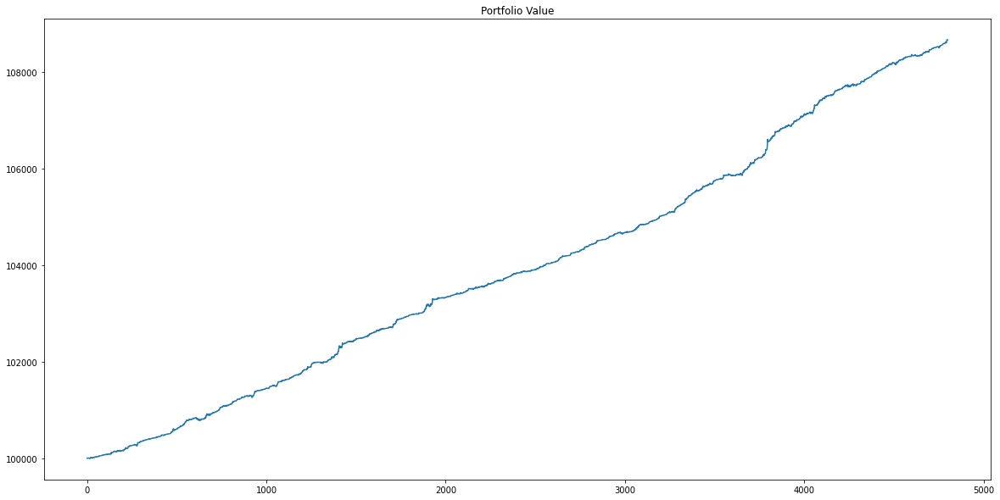

In [79]:
d=pd.DataFrame()
d['close']=data_train.close
d['labels']=ytrain_hat_rf
Results['RF_train_position1']=portfolio_evaluation(d,0,sig_thold,'RF Train positon1',4)

In [80]:
print(evaluate_classification(yval,yval_hat_rf))

              precision    recall  f1-score   support

        -1.0       0.51      0.62      0.56       578
         0.0       0.45      0.11      0.18       344
         1.0       0.52      0.63      0.57       578

    accuracy                           0.51      1500
   macro avg       0.49      0.46      0.44      1500
weighted avg       0.50      0.51      0.48      1500



Return is 2.870035500000056 % and final holding is -9.0*0.05 BTC
Buys:702, Sells:711, Holds:87
Sharpe Ratio is 3.169441304352693
Maximum quantities accumulated 26.0


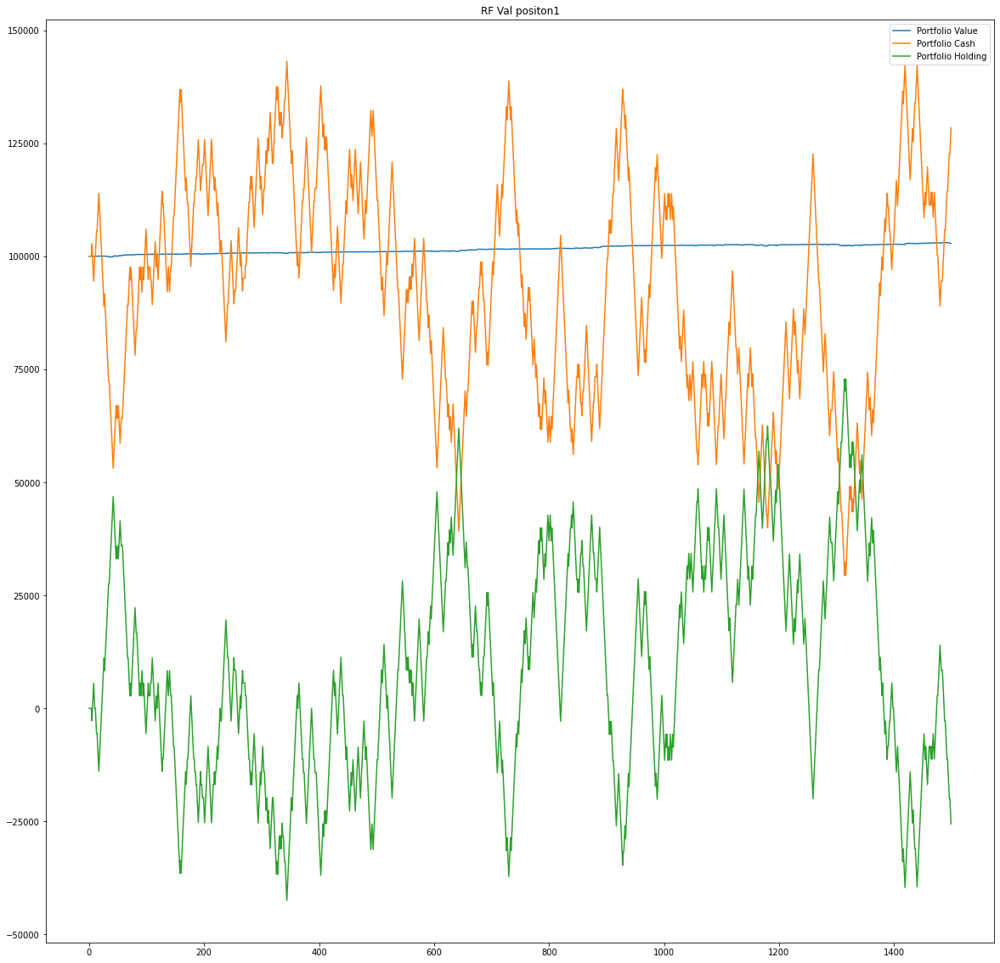

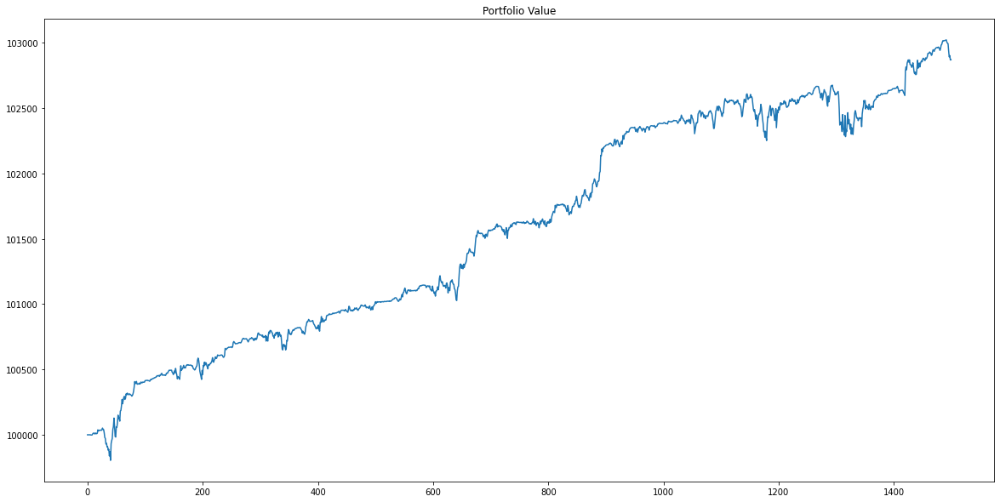

In [81]:
d=pd.DataFrame()
d['close']=data_val.close
d['labels']=yval_hat_rf
Results['RF_val_position1']=portfolio_evaluation(d,0,sig_thold,'RF Val positon1',4)

In [82]:
print(evaluate_classification(ytest,ytest_hat_rf))

              precision    recall  f1-score   support

        -1.0       0.52      0.54      0.53       691
         0.0       0.24      0.13      0.17       322
         1.0       0.52      0.61      0.56       687

    accuracy                           0.49      1700
   macro avg       0.42      0.42      0.42      1700
weighted avg       0.46      0.49      0.47      1700



Return is 2.258548999999912 % and final holding is 91.0*0.05 BTC
Buys:807, Sells:716, Holds:177
Sharpe Ratio is 0.2483904488376147
Maximum quantities accumulated 102.0


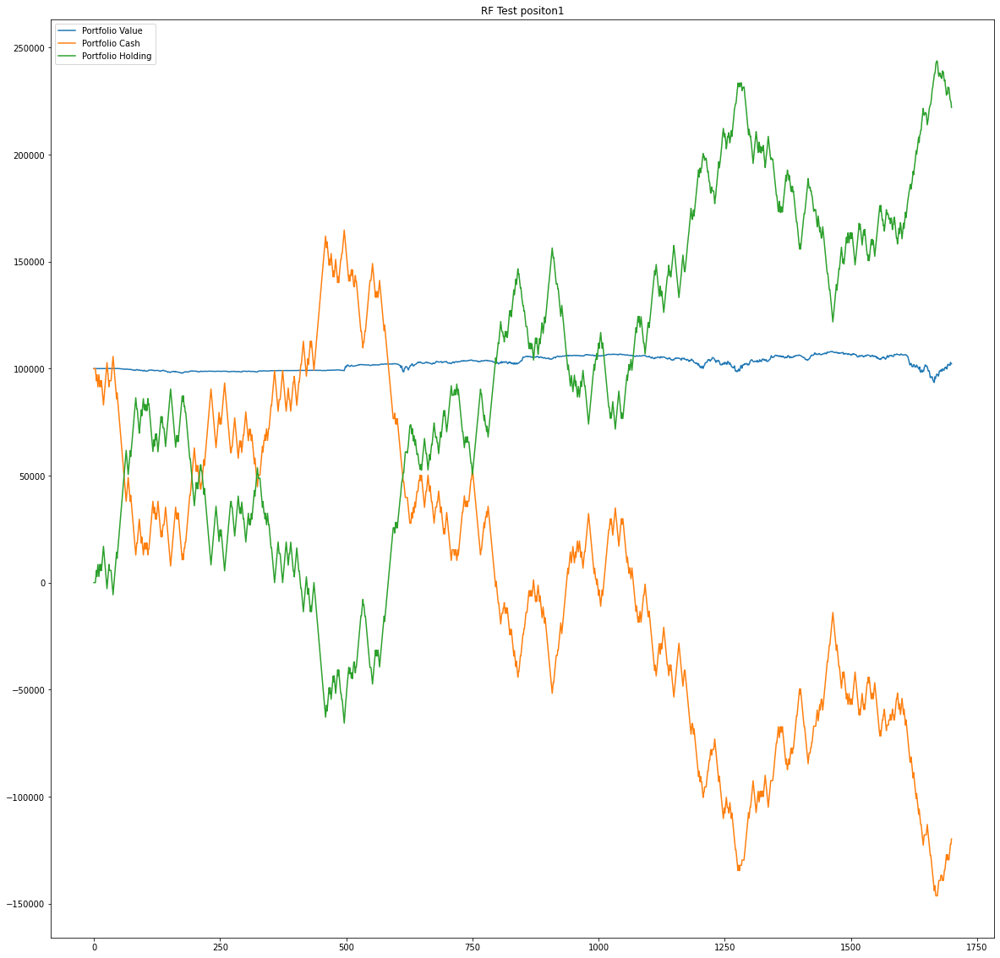

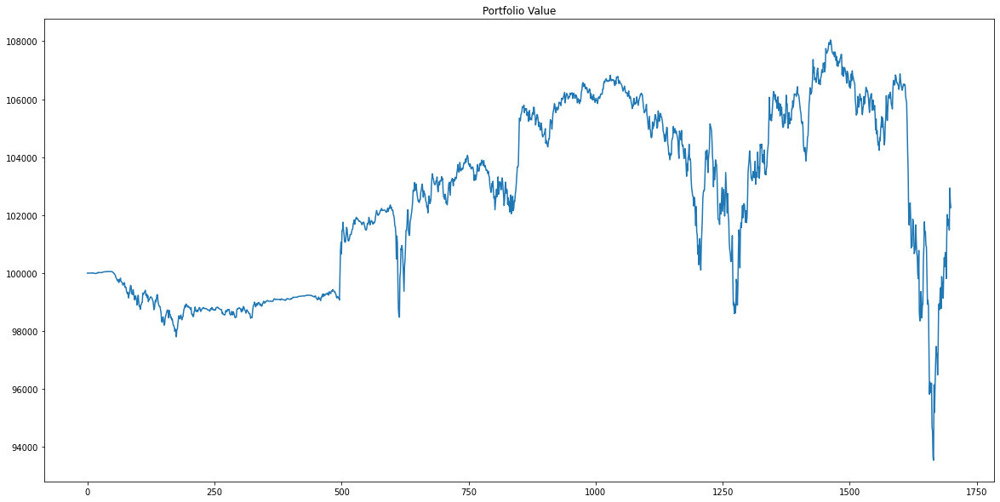

In [83]:
d=pd.DataFrame()
d['close']=data_test.close
d['labels']=ytest_hat_rf
Results['RF_test_position1']=portfolio_evaluation(d,0,sig_thold,'RF Test positon1',4)

We see that the ML models based results are particularly good in this case. Even better than the strategy. It is possible. Since we are deciding the labels based on certain logic on the returns, it could be possible that we might endup making more money had we chosen some other opportunity.

##### Importantly, if we can forecast the next minute return to a good extent and we if run the create_label_position strategy, it can actually work out well.

In [84]:
for i,j in Results.items():
    print(i,j)

Train_Simple {'maxqty': 13.0, 'sharpe': 2.047198907538879, 'Finalreturn': 2.3193204999999724}
Val_Simple {'maxqty': 15.0, 'sharpe': 0.5959486097585002, 'Finalreturn': 0.43619800000000397}
Test_simple {'maxqty': 39.0, 'sharpe': 1.566389939277755, 'Finalreturn': 10.241023500000113}
Logreg_Train_Simple {'maxqty': 112.0, 'sharpe': 0.3084251271220125, 'Finalreturn': 2.4254590000001772}
Logreg_val_simple {'maxqty': 120.0, 'sharpe': 0.012871273963344879, 'Finalreturn': -0.21587399999983609}
Logreg_test_simple {'maxqty': 872.0, 'sharpe': 0.7745525221060021, 'Finalreturn': -86.30350400000205}
RF_train_simple {'maxqty': 112.0, 'sharpe': 0.3084251271220125, 'Finalreturn': 2.4254590000001772}
RF_val_simple {'maxqty': 120.0, 'sharpe': 0.012871273963344879, 'Finalreturn': -0.21587399999983609}
RF_test_simple {'maxqty': 872.0, 'sharpe': 0.7745525221060021, 'Finalreturn': -86.30350400000205}
Train_position {'maxqty': 4.0, 'sharpe': 19.216274978024373, 'Finalreturn': 8.668490499999985}
Val_position {'m

##### Comparing the above results, the create_labels_positions has worked out well on train, test and validation data using the handmade indicators

But the position is not being accounted in these models. An indicator that will keep an account of that will be very helpful

### This was the case for just studing the buy and sell signals
In order to build an automated trading system a few important things should be considered in addition to the strategy.
- The quantity to be bought or to be sold. While taking a position one must look at available cash and the risk the person is willing to take.
- Profit booking and trailing stoploss. If after taking a position, if there is no movement in the favoured direction for certain amount of time, square off the position. So how many quantities should one square off?
- In the present implementation of the labeling function one possible idea to implement the trailing stoploss or profit booking:
    - After taking a new position, check if for certain time interval if there's a new position being taken or not.
    - If yes, update the time and check for the next certain interval.
    - If no, squareoff. (Again how many quantities to square off is a question)
- Ideally after backtesting the signals and everything, the work should be to get the forecasting of the return correctly.
- If the forecast is correct, one can implement the above strategy with the quantity and essentially fund management to develop a basic automated trading system.